In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

* Objectif : Crée un modèle prédictif pour les résultats sportifs, \
**Combien de but peut-on attendre d'un match de foot ?**
# Exploratory Data Analysis
## Descriptive statistique
- **Dimension** : 380 lignes, 12 colonnes
- **types des variables** : variable qualitative: 2 ; variable quantitative : 10
- **Nan** : Aucune valeur manquante
## Analyse de fond
`contexte`: les matchs de football se jouent a phase aller/retour pour chaque équipe, \
l'une a domicile et l'autre à l'extérieur
- **Target** :  global (56 % de valeurs *over 2,5*)
- **Signification des variables**: 
    * La distribution de mes données n'est pas gaussienne
    * on observe que pour la plupart des équipes, les valeurs enregistré lorsqu'elle joue a domicile \
    sont plus ou moins différents de ceux enrégistré a l'extérieur (mode, moyenne, outliers).
    
    `hypothèses`:\
        * Le résultat d'une équipe est étroitement lié a celui de son adversaire

In [2]:
df = pd.read_csv('/home/hhanstein/Projects/IA/probettor/football/data/2022_23/results/ligue1.csv', index_col='date_time', parse_dates=True)
df.head()

,journée,home_team,away_team,1st_home_team_goal,1st_away_team_goal,1st_total_goal,2nd_home_team_goal,2nd_away_team_goal,2nd_total_goal,total_home_team_goal,total_away_team_goal,global
date_time,,,,,,,,,,,,
2023-06-03 19:00:00,38,AC Ajaccio,Marseille,0,0,0,1,0,1,1,0,1
2023-06-03 19:00:00,38,Nice,Lyon,3,1,4,0,0,0,3,1,4
2023-06-03 19:00:00,38,Troyes,Lille,0,0,0,1,1,2,1,1,2
2023-06-03 19:00:00,38,Reims,Montpellier,1,0,1,0,3,3,1,3,4
2023-06-03 19:00:00,38,PSG,Clermont,2,2,4,0,1,1,2,3,5


In [3]:
df.shape

(380, 12)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 380 entries, 2023-06-03 19:00:00 to 2022-08-05 19:00:00
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   journée               380 non-null    int64 
 1   home_team             380 non-null    object
 2   away_team             380 non-null    object
 3   1st_home_team_goal    380 non-null    int64 
 4   1st_away_team_goal    380 non-null    int64 
 5   1st_total_goal        380 non-null    int64 
 6   2nd_home_team_goal    380 non-null    int64 
 7   2nd_away_team_goal    380 non-null    int64 
 8   2nd_total_goal        380 non-null    int64 
 9   total_home_team_goal  380 non-null    int64 
 10  total_away_team_goal  380 non-null    int64 
 11  global                380 non-null    int64 
dtypes: int64(10), object(2)
memory usage: 38.6+ KB


In [5]:
# Supprimer les colonnes qui ne ferons pas partie de l'étude
df.drop(['1st_home_team_goal', '1st_away_team_goal', '1st_total_goal',
         '2nd_home_team_goal', '2nd_away_team_goal', '2nd_total_goal'],
         axis=1, inplace=True)

In [6]:
print(f"{df['global'].sum()} buts total")
print(f"{df['global'].mean()} but moyen par match")
print(f"{df['total_home_team_goal'].sum()} goals scored by team at home / conceded by team at away")
print(f"{df['total_away_team_goal'].sum()} goals conceded by team at home / scored by team at away")

1067 buts total
2.807894736842105 but moyen par match
566 goals scored by team at home / conceded by team at away
501 goals conceded by team at home / scored by team at away


Text(0.5, 1.0, 'Target')

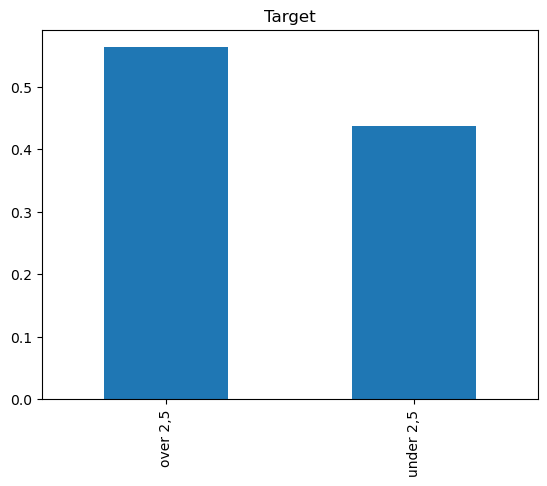

In [7]:
plt.figure()
labels_name = ['under 2,5', 'over 2,5']
target = pd.cut(x=df['global'], bins=[min(df['global']), 2, max(df['global'])],
              labels=labels_name, include_lowest=True)
target.value_counts(normalize=True).plot.bar()
plt.title('Target')


In [8]:
df.columns

Index(['journée', 'home_team', 'away_team', 'total_home_team_goal',
       'total_away_team_goal', 'global'],
      dtype='object')

In [9]:
dico = {'total_home_team_goal': 'home_team_scored',
        'total_away_team_goal': 'home_team_conceded'}
df.rename(columns=dico, inplace=True)
df['away_team_scored'] = df['home_team_conceded']
df['away_team_conceded'] = df['home_team_scored']
df.columns

Index(['journée', 'home_team', 'away_team', 'home_team_scored',
       'home_team_conceded', 'global', 'away_team_scored',
       'away_team_conceded'],
      dtype='object')

### Visualisation des variables
* Crée une fonction *viz* qui prend pour argument le nom de l'équipe a observer
* crée deux sous-ensemble de données (domicile et extérieur)
* Observer pour chaque sous ensemble, la variable sélectionner

In [10]:
def viz_target(team):
    """_summary_

    Args:
        team (str): Nom de l'équipe à observer
    """
    labels_name = ['under 2,5', 'over 2,5']
    df['target'] = pd.cut(x=df['global'], bins=[min(df['global']), 2, max(df['global'])],
                          labels=labels_name, include_lowest=True)
    home = df[df['home_team']==team]
    away = df[df['away_team']==team]
    fig, axs = plt.subplots(1, 2, sharey=True, sharex=True, figsize=(7, 5))
    sns.histplot(data=home, x=home['global'], kde=True, ax=axs[0], hue=home['target'], discrete=True)
    sns.histplot(data=away, x=away['global'], kde=True, ax=axs[1], hue=away['target'], discrete=True)
    axs[0].set_xlabel('global at home')
    axs[1].set_xlabel('global at away')
    plt.title(team)
    plt.show()

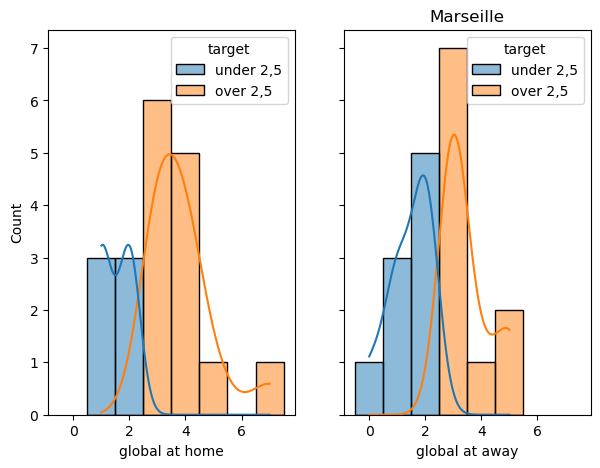

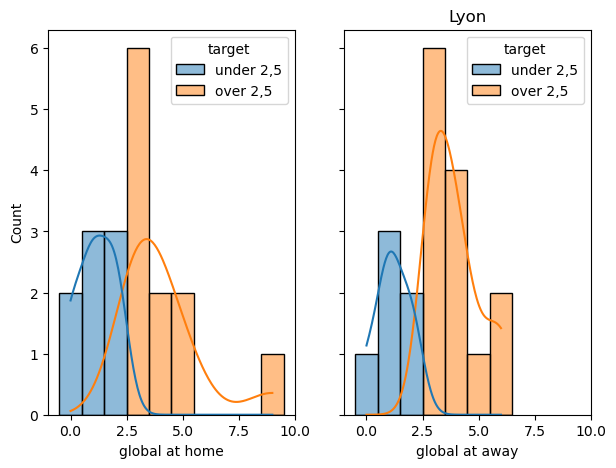

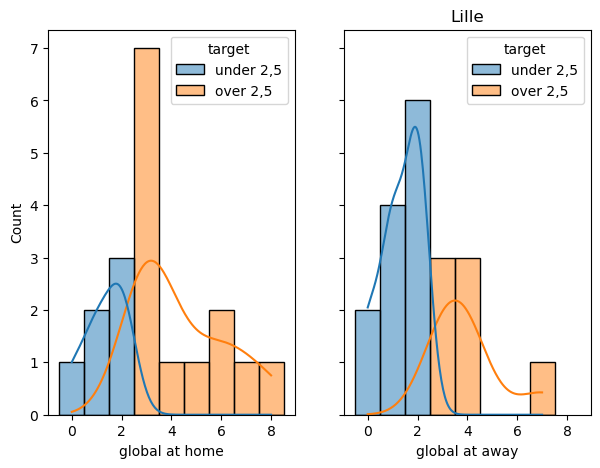

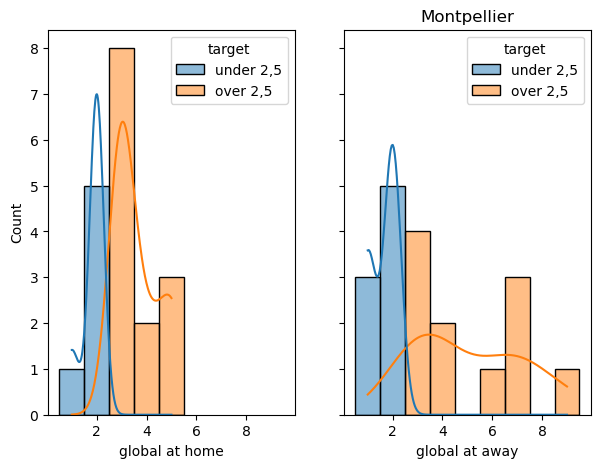

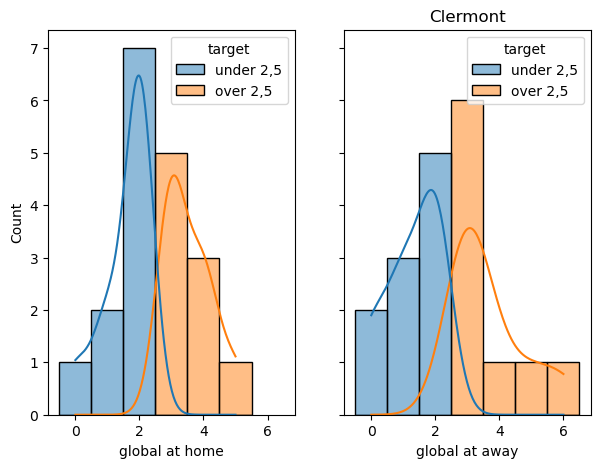

...

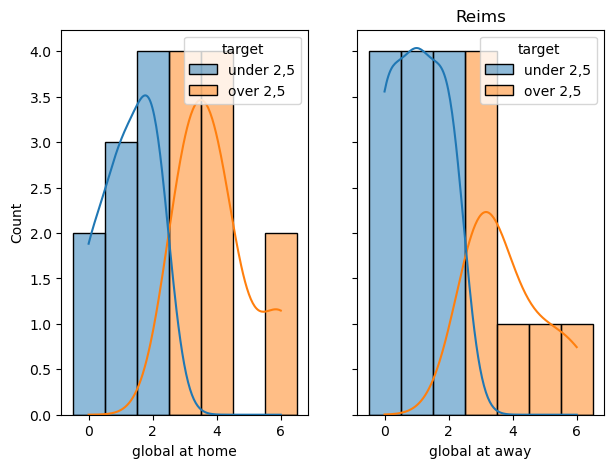

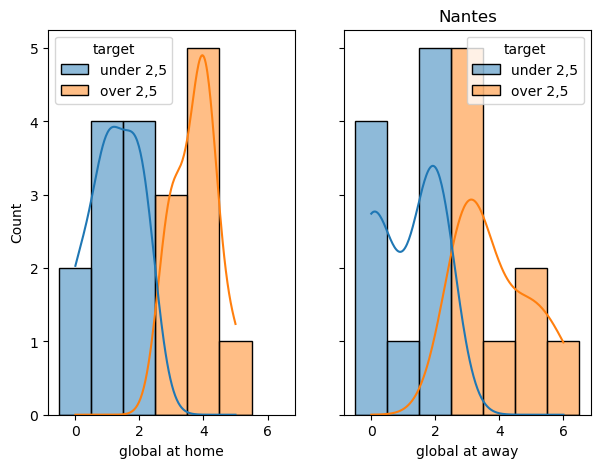

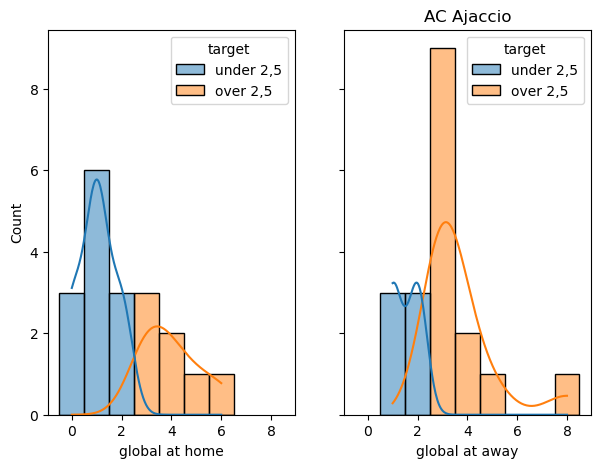

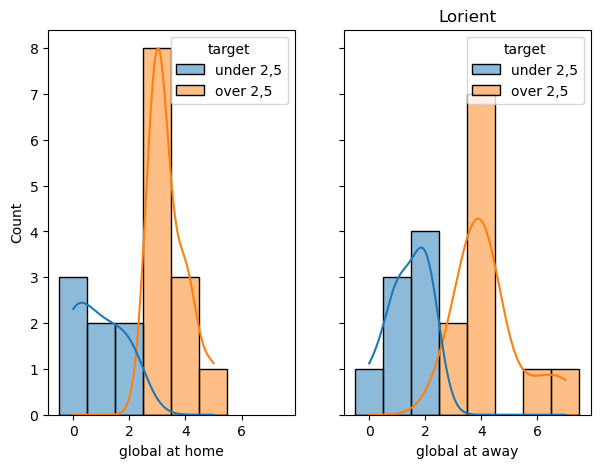

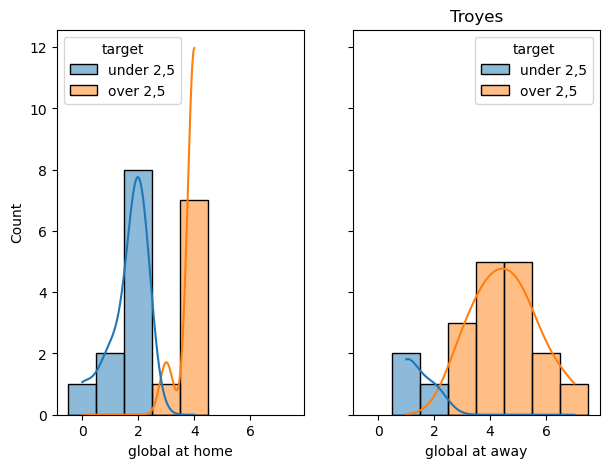

In [11]:
for team in df['away_team'].unique():
    viz_target(team)

In [12]:
def viz_feature(team, feature):
    """_summary_

    Args:
        team (str): Nom de l'équipe à étudier
        feature (str): Nom de la variable a visualiser
    """
    home = df[df['home_team']==team]
    away = df[df['away_team']==team]
    fig, axs = plt.subplots(1, 2, sharey=True, sharex=True, figsize=(7, 5))
    sns.histplot(data=home, x=home[f'home_team_{feature}'], kde=True, ax=axs[0], hue=home['target'], discrete=True)
    sns.histplot(data=away, x=away[f'away_team_{feature}'], kde=True, ax=axs[1], hue=away['target'], discrete=True)
    axs[0].set_xlabel(f'{feature} at home')
    axs[1].set_xlabel(f'{feature} at away')
    plt.title(team)
    plt.show()

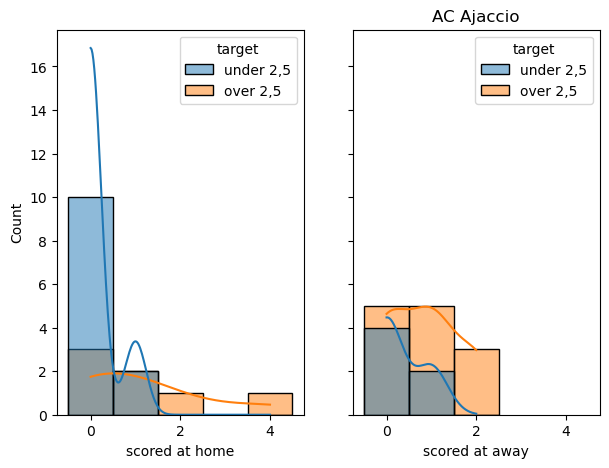

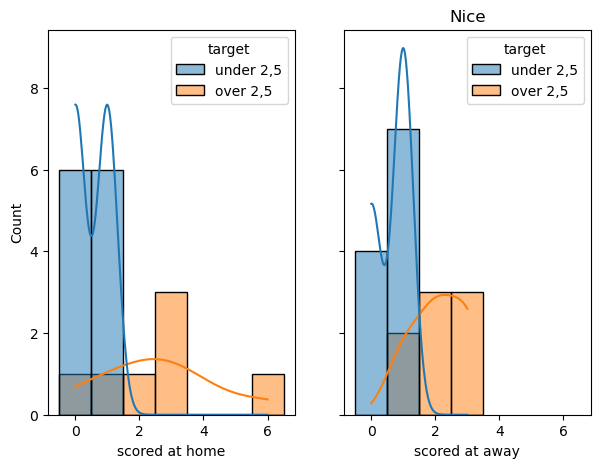

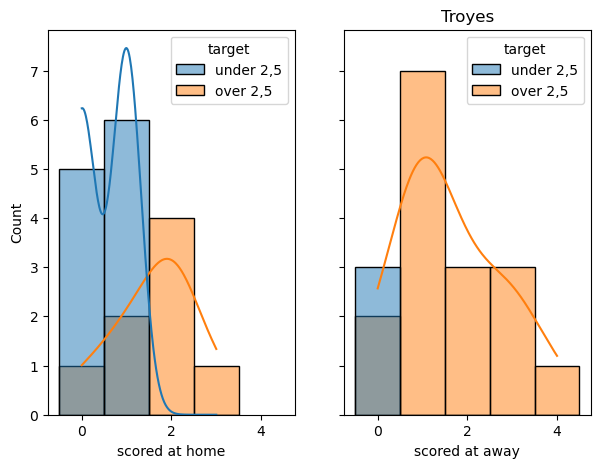

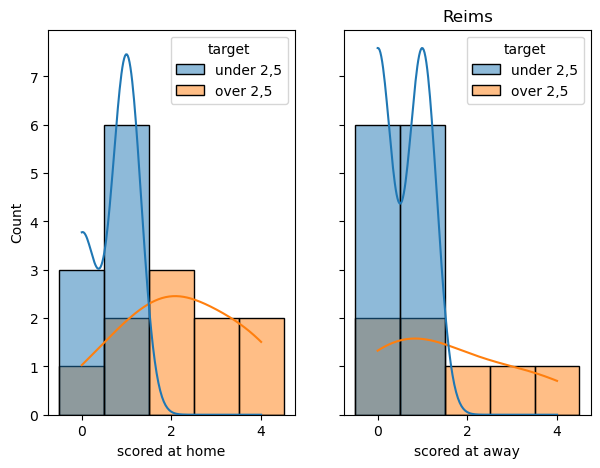

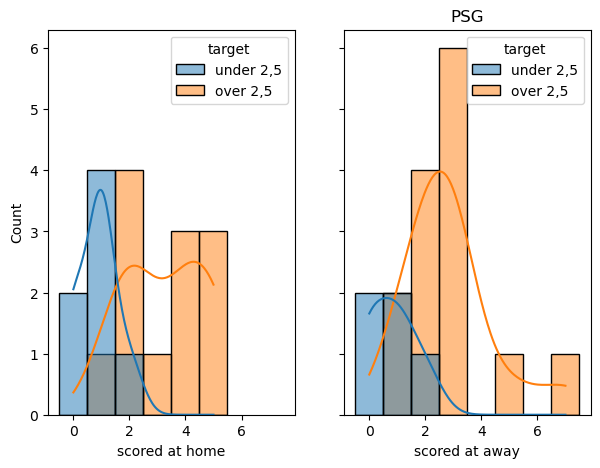

...

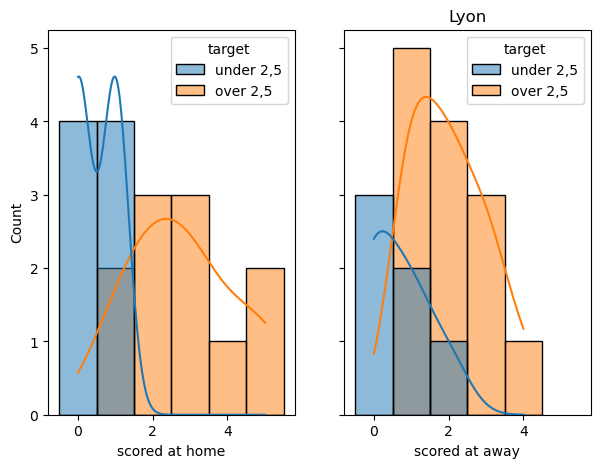

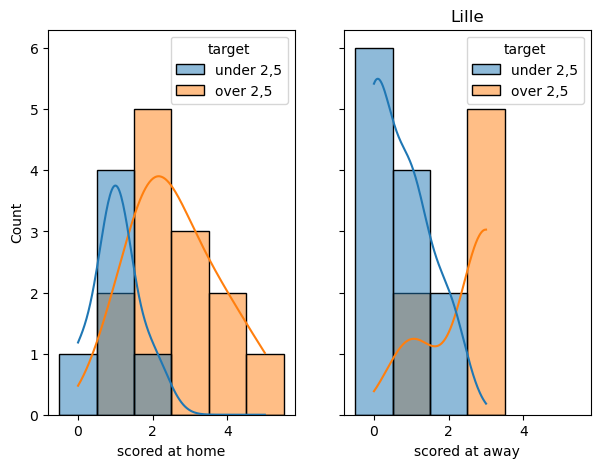

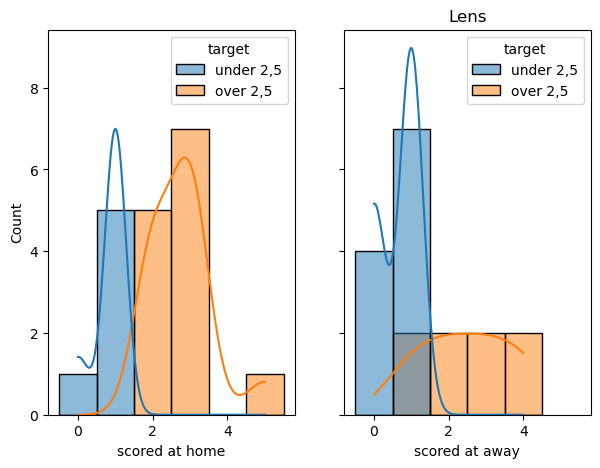

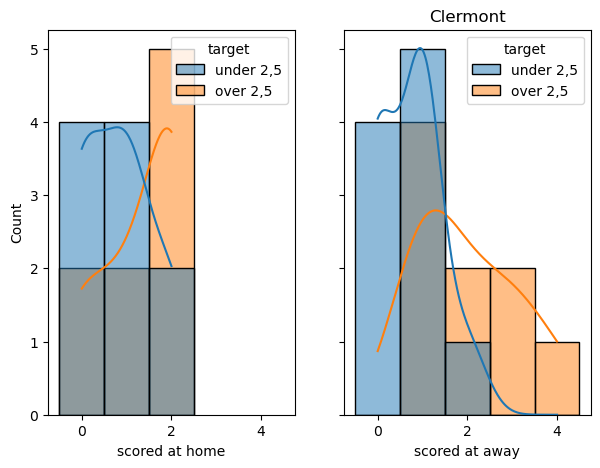

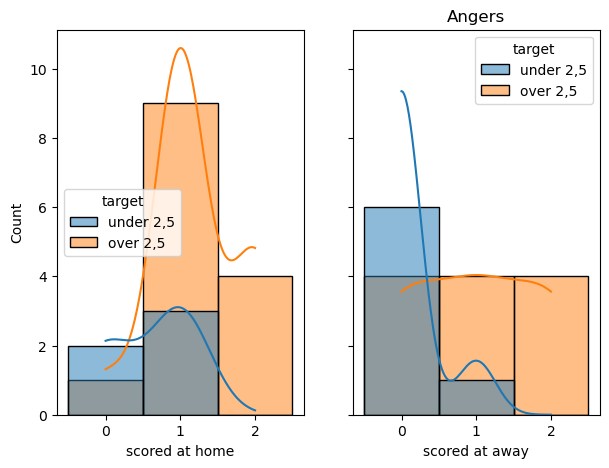

In [13]:
for team in df.home_team.unique():
    viz_feature(team, feature='scored')

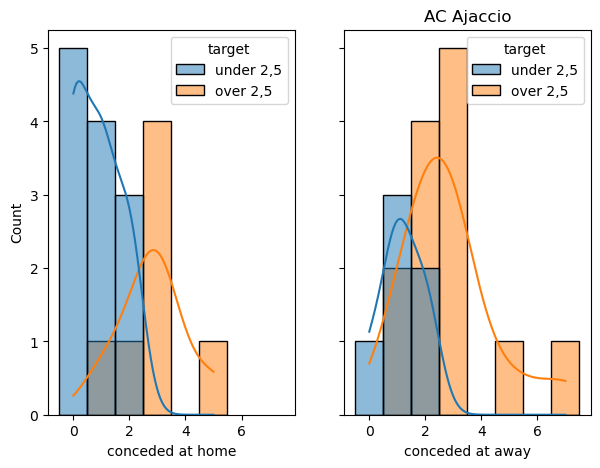

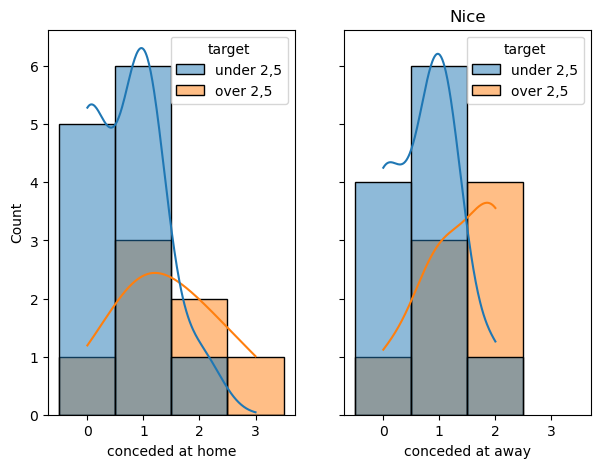

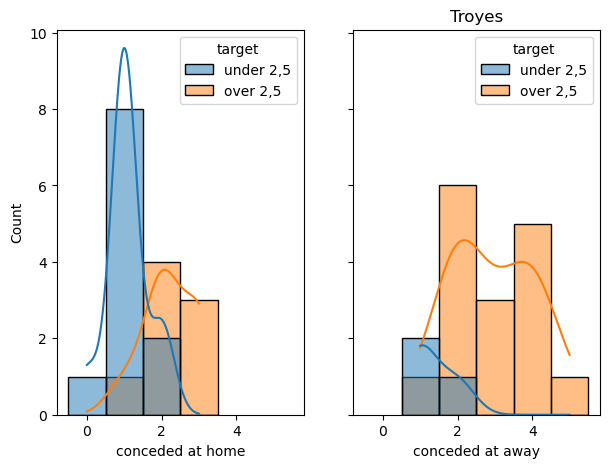

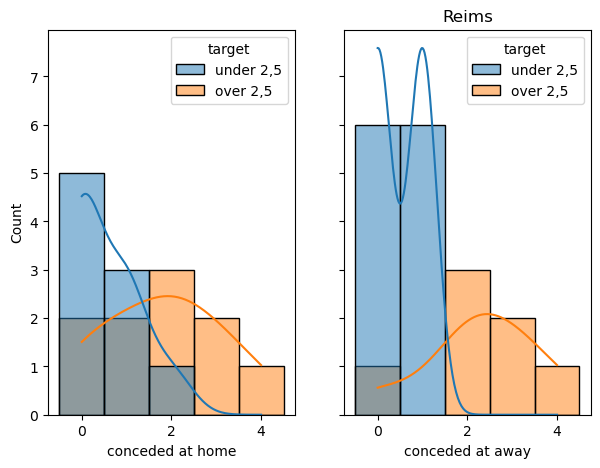

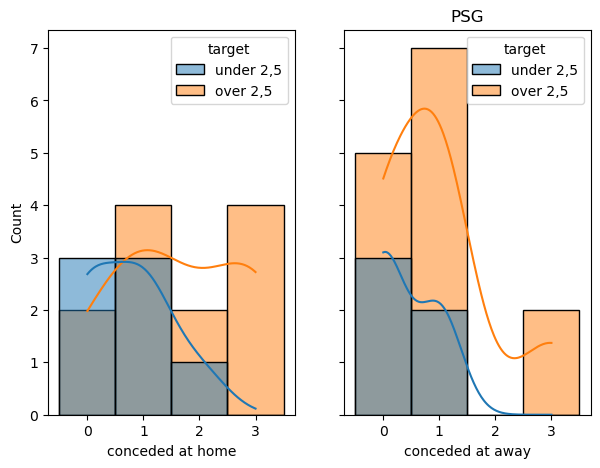

...

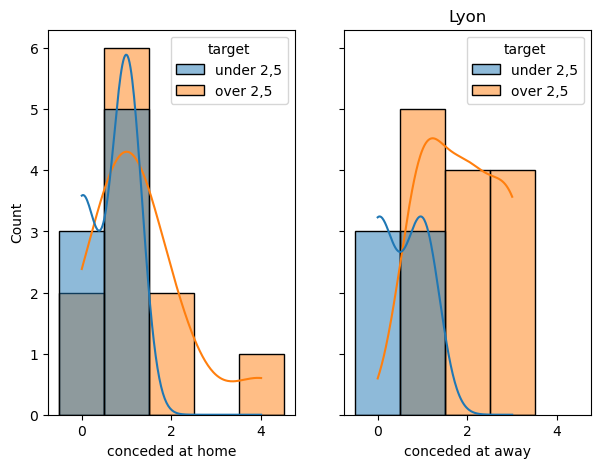

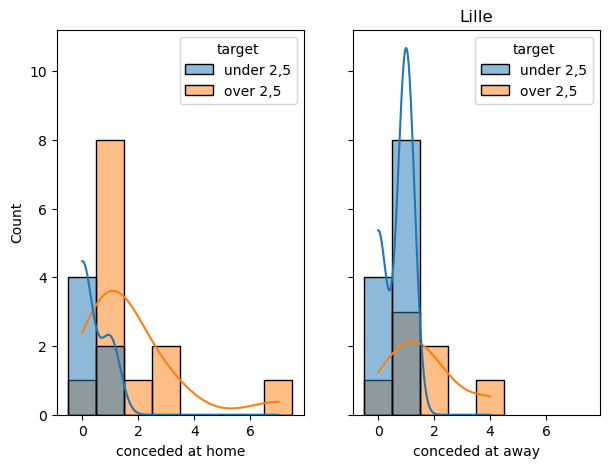

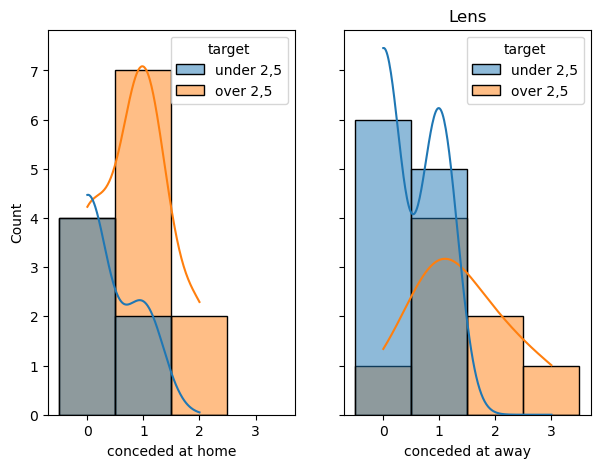

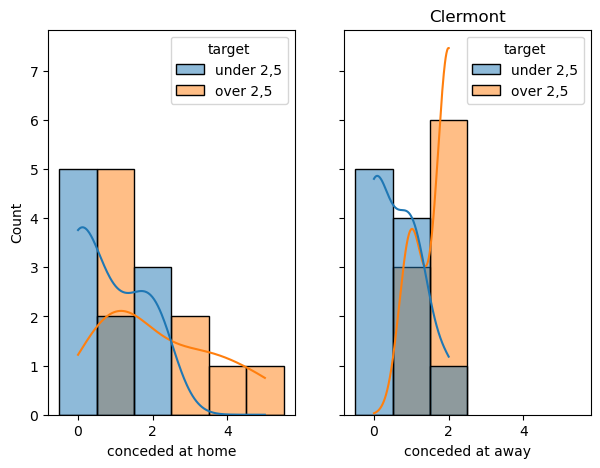

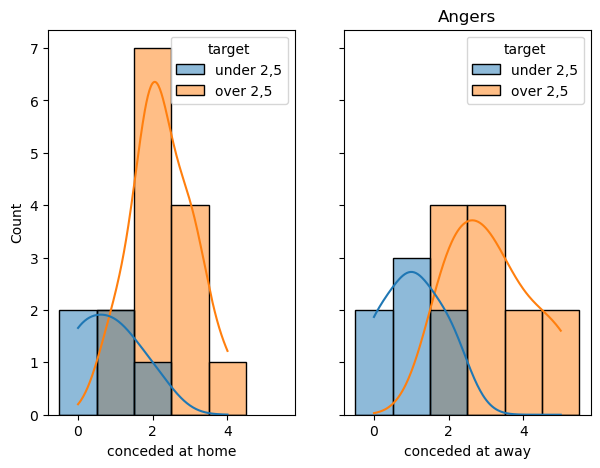

In [14]:
for team in df.home_team.unique():
    viz_feature(team, feature='conceded')

### Target / Feature relationship
#### Création de sous-ensemble under / over
On vas observer en fonction de chaque sous-ensemble \
la rélation entre la target et les variables

In [48]:
under = df[df['target'] == 'under 2,5']
over = df[df['target'] == 'over 2,5']

In [57]:
df.columns

Index(['journée', 'home_team', 'away_team', 'home_team_scored',
       'home_team_conceded', 'global', 'away_team_scored',
       'away_team_conceded', 'target'],
      dtype='object')

In [69]:
def rel_feature(team, feature):
    """Observe la rélation entre la target et `feature`

    Args:
        team (str): Nom de l'équipe à étudier
        feature (str): Nom de la variable a visualiser
    """
    home = df[df['home_team']==team]
    away = df[df['away_team']==team]
    fig, axs = plt.subplots(1, 2, sharey=True, sharex=True, figsize=(7, 5))
    axs[0].scatter(x=home[f'home_team_{feature}'], y=home['global'])
    sns.scatterplot(data=away, x=away[f'home_team_{feature}'], y=away['global'],
                    ax=axs[1])
    axs[0].set_xlabel(f'{feature} at home')
    axs[0].set_ylabel('global at home')
    axs[1].set_xlabel(f'{feature} at away')
    axs[1].set_ylabel('global at away')
    plt.title(team)
    plt.suptitle(f'Target / {feature} relationship')
    plt.show()

la j'ai un peu de mal a visualiser la rélation entre mes variables, pour une meilleur vue, 
je dois pouvoir les marker grâce au nombreux arguments

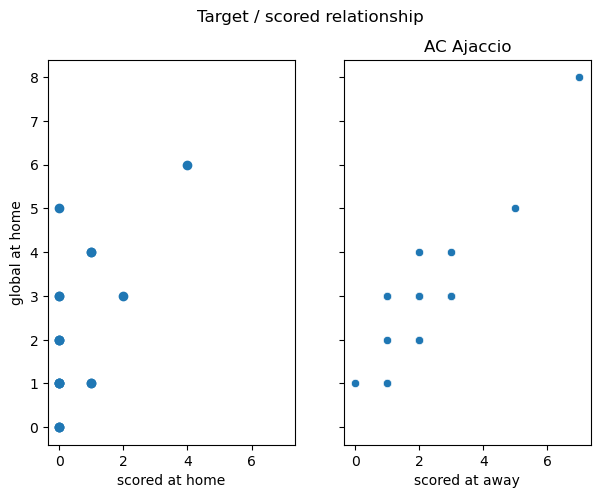

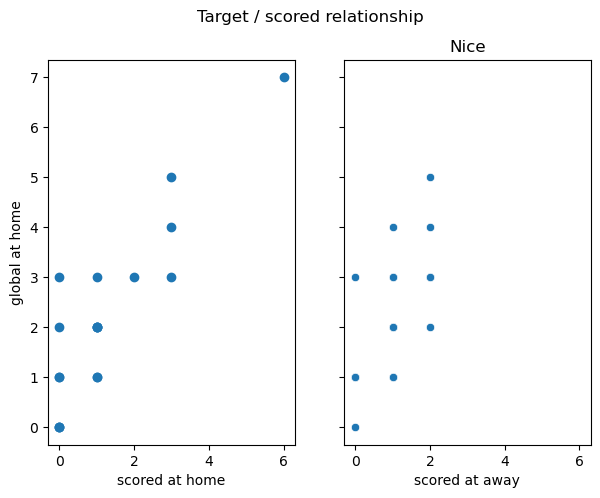

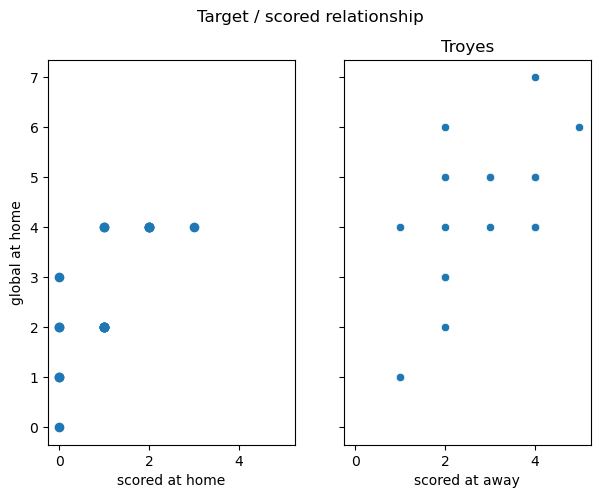

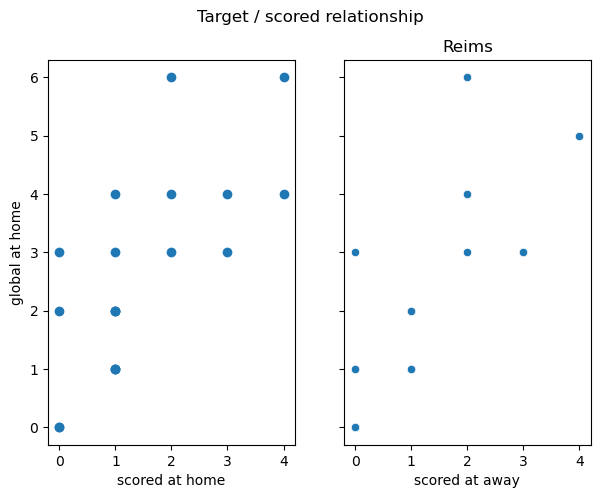

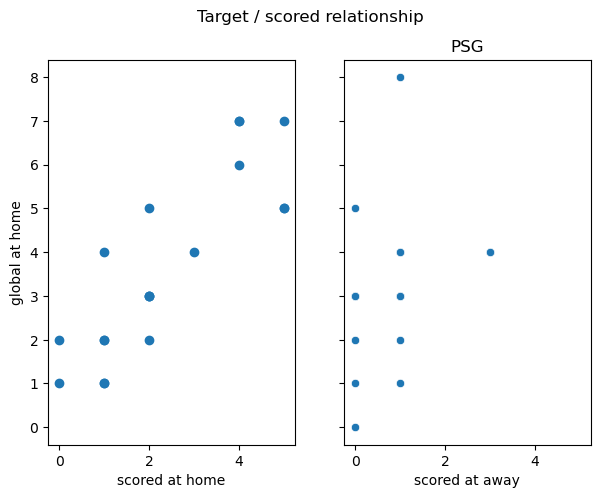

...

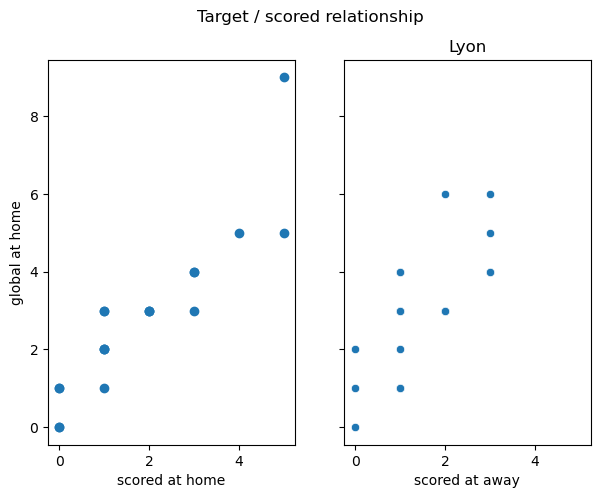

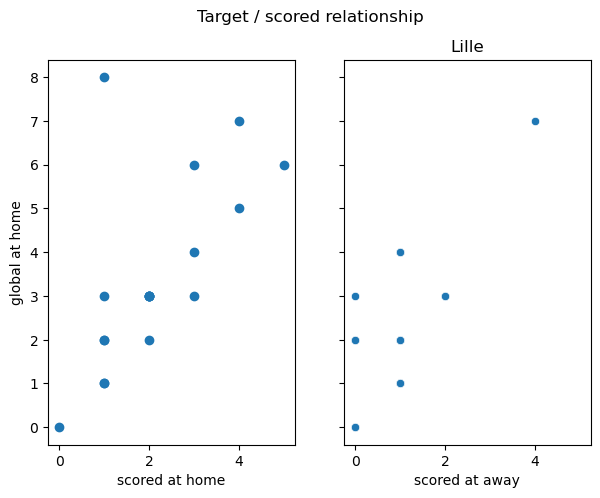

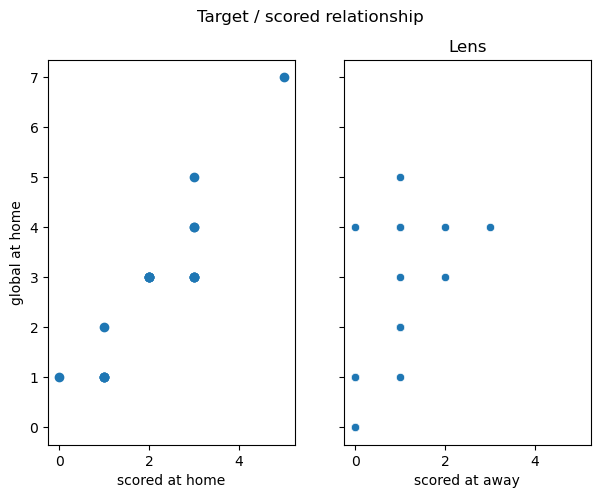

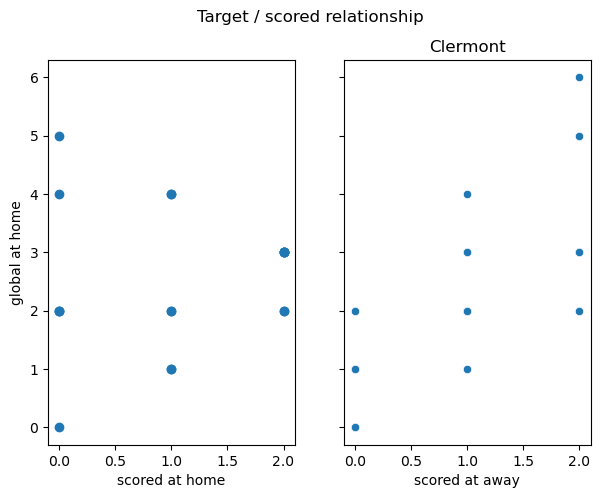

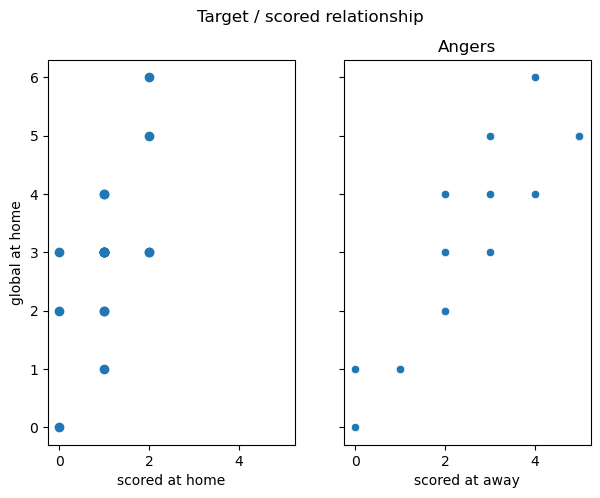

In [70]:
for team in df.home_team.unique():
    rel_feature(team, feature='scored')

In [15]:
at_home = df.groupby('home_team')[['home_team_scored', 'home_team_conceded']].mean()
at_away = df.groupby('away_team')[['away_team_scored', 'away_team_conceded']].mean()
overall = pd.concat([at_home, at_away], axis=1, ignore_index=False)
overall.columns

Index(['home_team_scored', 'home_team_conceded', 'away_team_scored',
       'away_team_conceded'],
      dtype='object')

<Figure size 640x480 with 0 Axes>

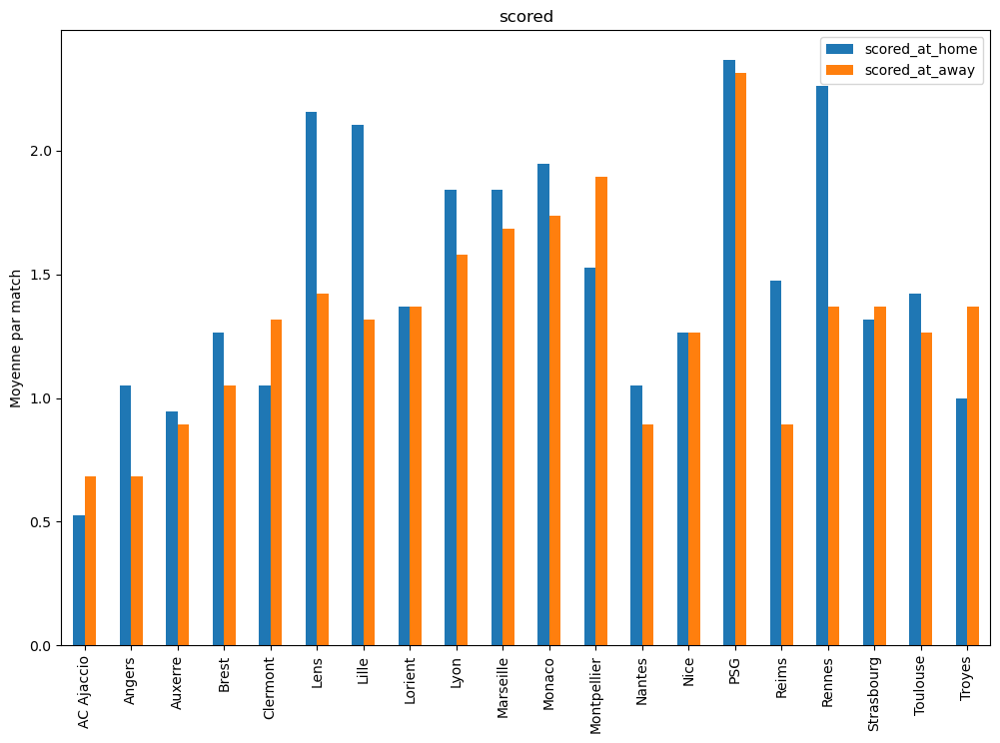

In [16]:
plt.figure()
fig = overall.drop(['home_team_conceded', 'away_team_conceded'],
                   axis=1).rename(columns=({'home_team_scored':'scored_at_home',
                                            'away_team_scored':'scored_at_away'}))
fig.plot.bar(figsize=(12, 8))
plt.ylabel('Moyenne par match')
plt.title('scored')
plt.show()

<Figure size 640x480 with 0 Axes>

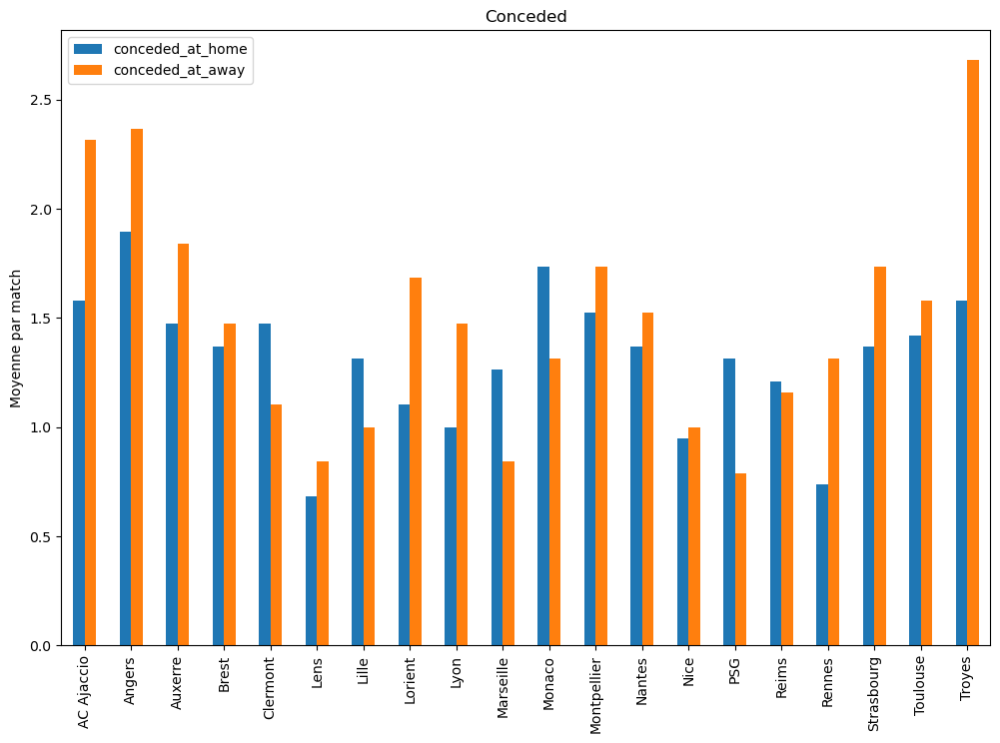

In [17]:
plt.figure()
fig = overall.drop(['home_team_scored', 'away_team_scored'],
                   axis=1).rename(columns=({'home_team_conceded':'conceded_at_home',
                                            'away_team_conceded':'conceded_at_away'}))
fig.plot.bar(figsize=(12, 8))
plt.ylabel('Moyenne par match')
plt.title('Conceded')
plt.show()

```Note```
On remarque que la moyenne est différente pour chaque équipe  \ 
A première vu, on distingue deux groupe d'individus:  /
* les équipes dont la moyenne de but marqué a domicile gt la moyenne des buts marqué a l'extérieur
* les équipes dont la moyenne de but marqué a domicile lt la moyenne des buts marqué a l'extérieur

### Distribution
Observation de la distribution des features.

In [18]:
df.columns

Index(['journée', 'home_team', 'away_team', 'home_team_scored',
       'home_team_conceded', 'global', 'away_team_scored',
       'away_team_conceded', 'target'],
      dtype='object')

In [19]:
def dist_viz(team):
    """Show distribution and statistique of each feature at once
    Args:
        team (str): nom de l'équipe
    """
    data_home = df[df['home_team']==team]
    data_away = df[df['away_team']==team]
    fig, axs = plt.subplots(2, 3, sharey=True, sharex=True)
    # plt.title(f'{team}')
    axs[0, 0].set_xlabel('scored at home')
    axs[0, 0].text(5, 12, 'sdt=5')
    axs[1, 0].set_xlabel('scored at away')
    axs[0, 1].set_xlabel('conceded at home')
    axs[1, 1].set_xlabel('conceded at away')
    axs[0, 2].set_xlabel('global at home')
    axs[1, 2].set_xlabel('global at away')
    sns.histplot(data=data_home, x=data_home.home_team_scored, kde=True, ax=axs[0, 0], discrete=True)
    sns.histplot(data=data_away, x=data_away.away_team_scored, kde=True, ax=axs[1, 0], discrete=True)
    sns.histplot(data=data_home, x=data_home.home_team_conceded, kde=True, ax=axs[0, 1], discrete=True)
    sns.histplot(data=data_away, x=data_away.away_team_conceded, kde=True, ax=axs[1, 1], discrete=True)
    sns.histplot(data=data_home, x=data_home['global'], kde=True, ax=axs[0, 2], discrete=True)
    sns.histplot(data=data_away, x=data_away['global'], kde=True, ax=axs[1, 2], discrete=True)
    plt.show()

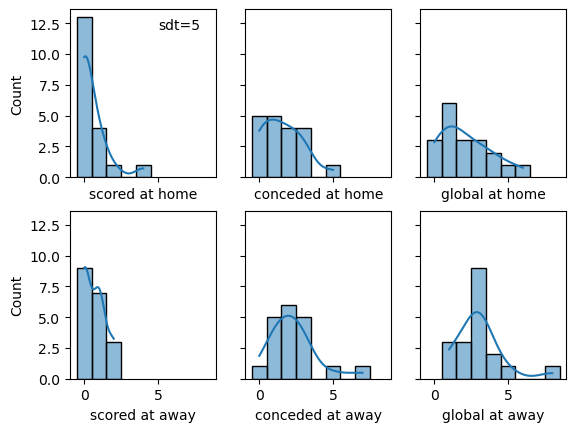

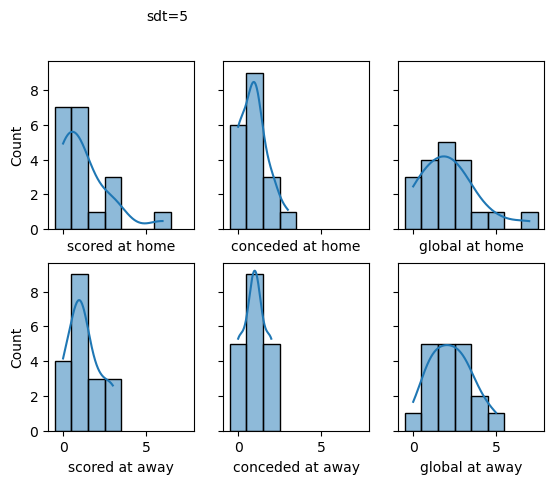

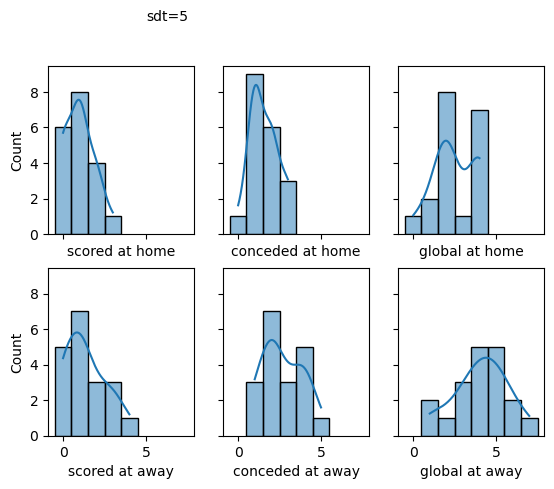

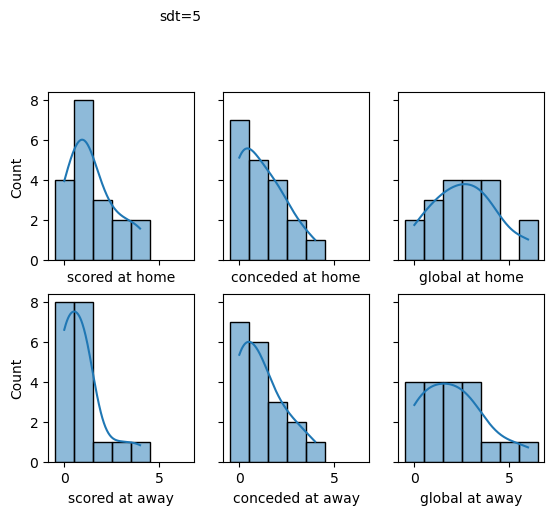

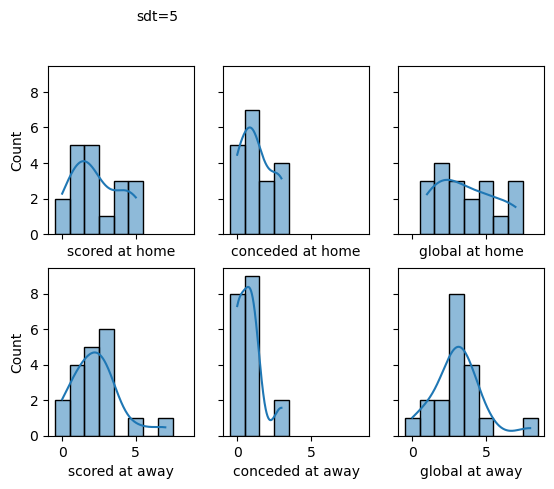

...

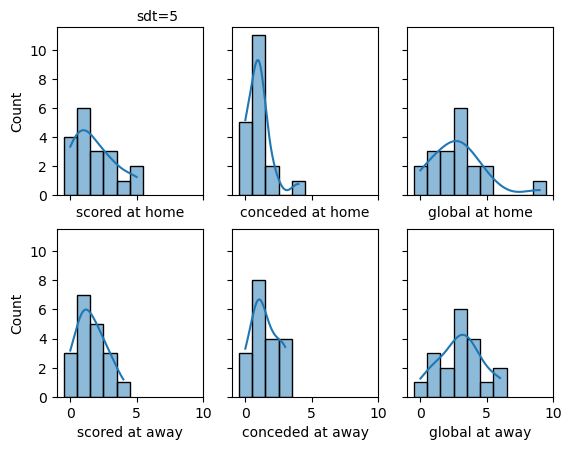

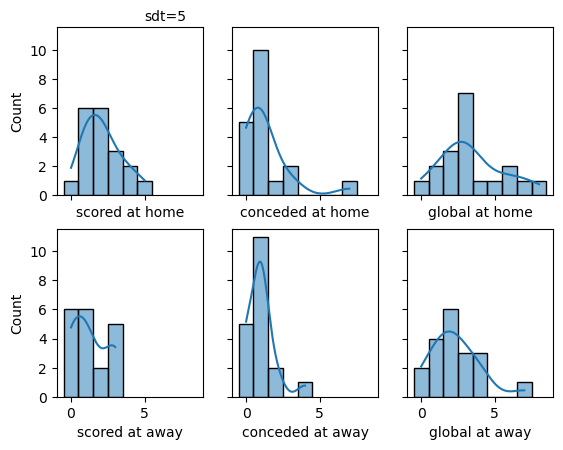

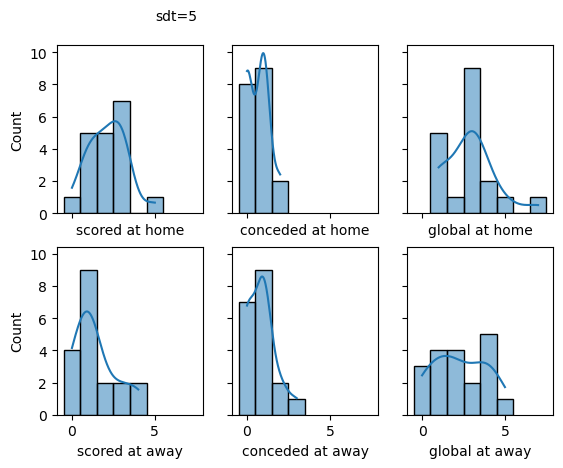

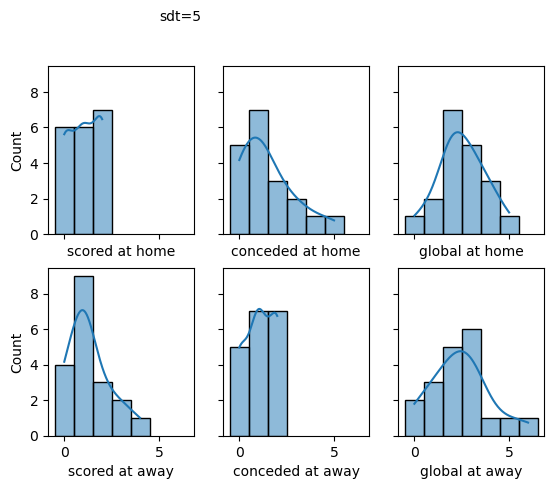

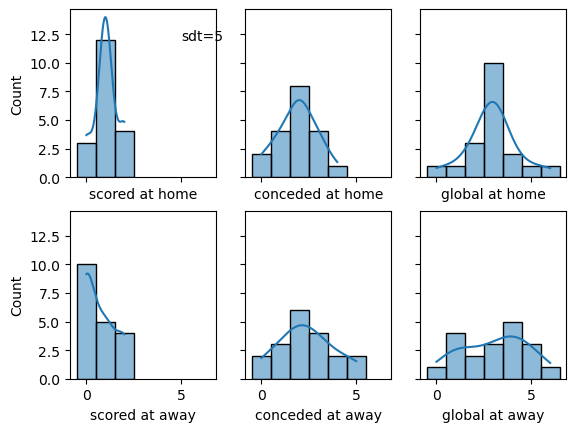

In [20]:
for team in df['home_team'].unique():
    dist_viz(team)

### Global

In [21]:
df.columns

Index(['journée', 'home_team', 'away_team', 'home_team_scored',
       'home_team_conceded', 'global', 'away_team_scored',
       'away_team_conceded', 'target'],
      dtype='object')

In [22]:
data_home = 
fig, axs = plt.subplots()
axs = sns.histplot(data= )
fig = overall.drop(['home_team_scored', 'away_team_scored'],
                   axis=1).rename(columns=({'home_team_conceded':'conceded_at_home',
                                            'away_team_conceded':'conceded_at_away'}))
fig.plot.bar(figsize=(12, 8))
plt.ylabel('Moyenne par match')
plt.title('Conceded')
plt.show()

SyntaxError: invalid syntax (3505107622.py, line 1)

In [ ]:
plt.figure()
overall.drop(['home_scored', 'away_scored', 'global'], axis=1).rename(columns=
                                                                          ({'home_conceded':'conceded_at_home',
                                                                            'away_conceded':'conceded_at_away'})).plot.bar(figsize=(12, 8))
plt.show()

KeyError: "['home_scored', 'away_scored', 'global'] not found in axis"

<Figure size 640x480 with 0 Axes>

### Interpretation 
* Selon que les équipes jouent a domicile ou a l'exterieur, on observe une différence plus ou moins importantes 
parmis les variables
    ```Une équipe peut avoir inscrit ou concédé plus de but a domicile qu'a l'exterieur```
     
* la variables "global" étant la somme des variables "scored" & "conceded", nous pouvons constater que :
    ``` sous certains cas de figure "Global" est plus dépendante du résultat d'une seul équipe```



### Analyse de fond
#### choix des variables 
    pour cette etude je ne vais que selectionner les variables suivantes:
        * total_home_team_goal (but scoré/concedé)
        * total_away_team_goal
        * global (total but dans le match)
#### population
    - les 5 premiers
    - les 3 derniers

In [ ]:
# Quels sont les questions auquels j'ai envie de répondre ?
ce serait intéressant de pouvoir sortir une visualisation rapide, répresentant pour chaque équipe 
un sommaire statistique sur les variables sélectionner. par exemple :
un histogramme des but marqué a domicile/ exterieur
    but conceded a domicile/ exterieur 
et un histogramme de la variable global a domicile et a l'exterieur.

Mais cela il me semble est une analyse de forme mais pour ce qui est de l'analyse de forme?



# je dois pouvoir faire des calculs sur les variables global et representer par des  histogramme
# nous pouvons observer qu'en générale le pourcentage de but <<over>> est superieur.
# graphique pie ; domicile et exterieur
# d'abord on va crée une fnction qui vas faire le classement des equipes en fontion d'une colonne donné
# filtrer et recuperer uniqment la population concerné, faire un value count
# et afficher le resultat sous forme de graphique de pie

"""df['%_over2,5'] = ''
df['%_under2,5'] = 'plt.pie()'
df['target'].value_counts(normalize=True)"""
df2 = df[['home_team', 'total_home_team_goal']]
grouped = df2.groupby("home_team")  
grouped.sum().sort_values(by='total_home_team_goal', ascending=False)

,total_home_team_goal
home_team,
PSG,45
Rennes,43
Lens,41
Lille,40
Monaco,37
Marseille,35
Lyon,35
Montpellier,29
Reims,28


On vas crée plusieurs fonction viz regroupant différents aspects
1- la première chose a observer c'est la distribution des features selon leur classes (home, away, overall)
    pour cela on aura besoin de representer les graphique sur plusieurs panes; par exemple si je veux pouvoir visualiser les "global" features, je dois crée une fonction qui prends en paramètre, le nom d'une équipe
    ensuite filtrer les données selon qu'elle ait été produit a domicile ou autre...
    avec mes différents dataframe, je pourrais observer pour chacune d'entre elle :
    # la distribution de la variable
    # la répartition des points par rapport aux journée de championnats, et par rapport a elles même, 
      ce qui nous sera utile pour determiner si le changement de location influence les résultats 

le travail précedant était d'observer la distribution de mes variables, mais 

In [ ]:
def viz_dist_features (team):
    home = df[df['home_team']==team]
    away = df[df['away_team']==team]
    overall = pd.concat([home, away], axis=0)
    overall.sort_values(by='journée', ascending=True, inplace = True)
    f, axes = plt.subplots(1, 3, sharex=True, figsize=(10, 5))
    # viz = sns.FacetGrid(home)
    # viz.map(sns.histplot, "global", kde=True)
    sns.histplot(data=away, x=away['global'], kde=True, ax=axes[2])
    sns.histplot(data=home, x=home['global'], kde=True, ax=axes[1])
    sns.histplot(data=overall, x=overall['global'], kde=True, ax=axes[0])
    plt.title(team)

def viz_scatter_features (team):
    home = df[df['home_team']==team]
    away = df[df['away_team']==team]
    overall = pd.concat([home, away], axis=0)
    overall.sort_values(by='journée', ascending=True, inplace = True)
    f, axes = plt.subplots(1, 3, sharex=True, figsize=(10, 5))
    # viz = sns.FacetGrid(home)
    # viz.map(sns.histplot, "global", kde=True)
    sns.scatterplot(data=away, y=away['global'], x=away["journée"], ax=axes[2])
    sns.scatterplot(data=home, y=home['global'], x=home['journée'], ax=axes[1])
    sns.scatterplot(data=overall, y=overall['global'], x=overall['journée'], hue=overall['journée'],
                    ax=axes[0])
    plt.title(team)

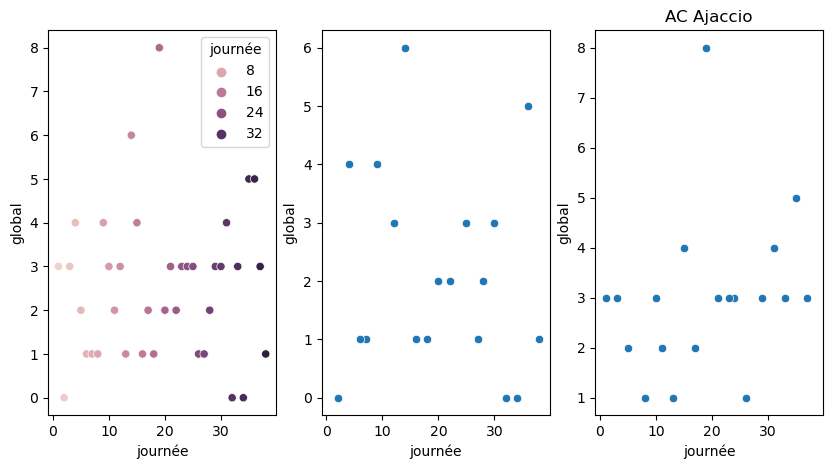

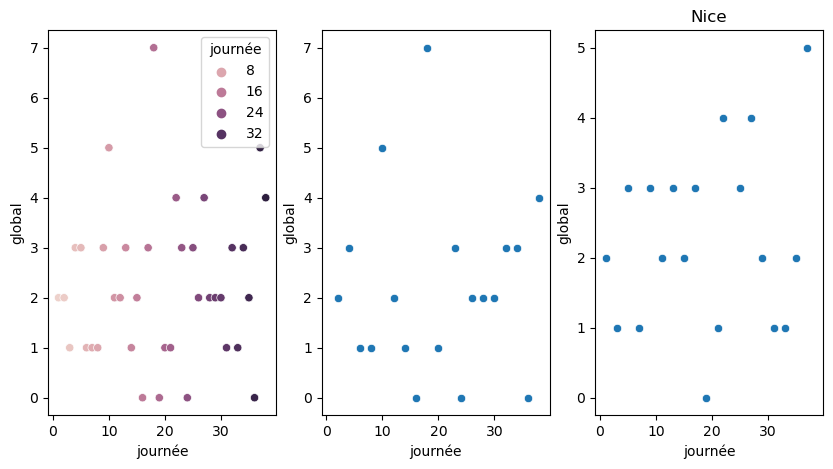

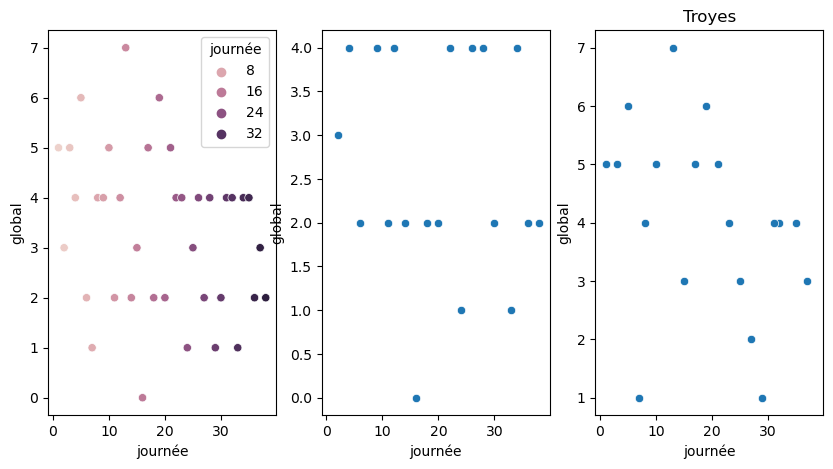

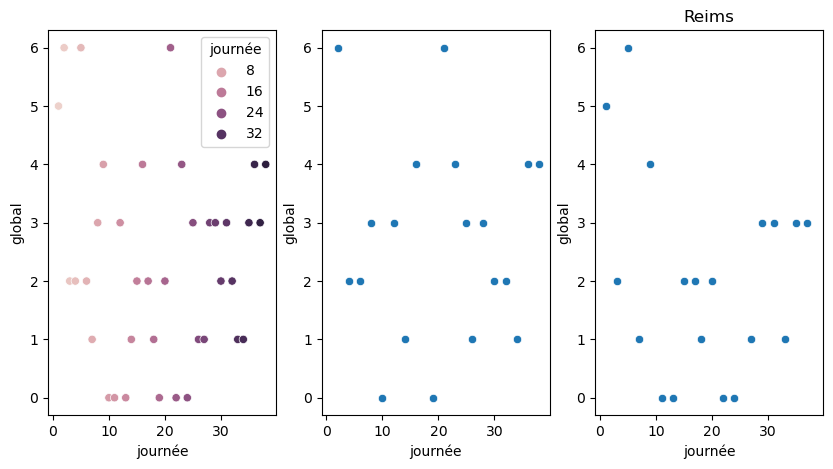

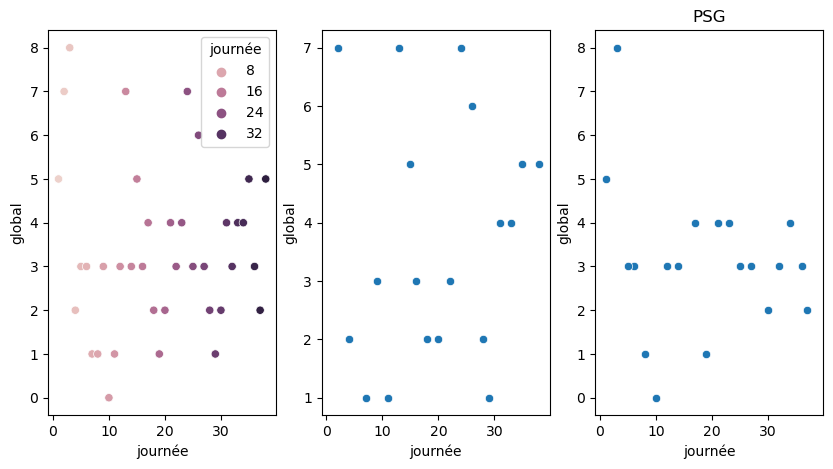

...

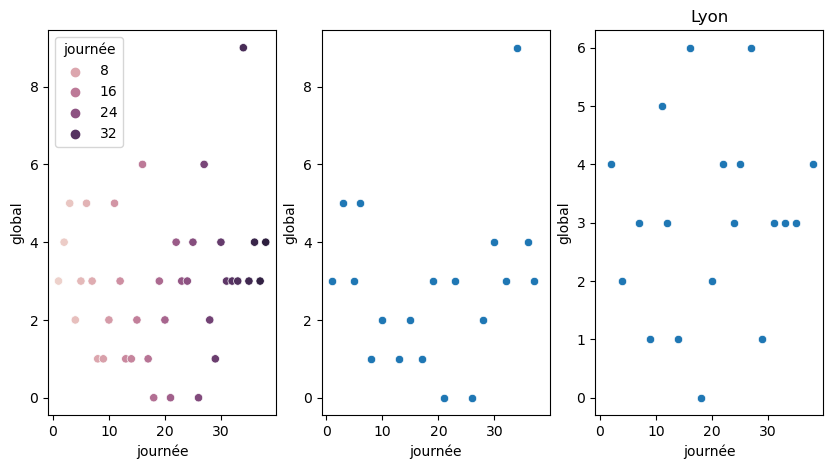

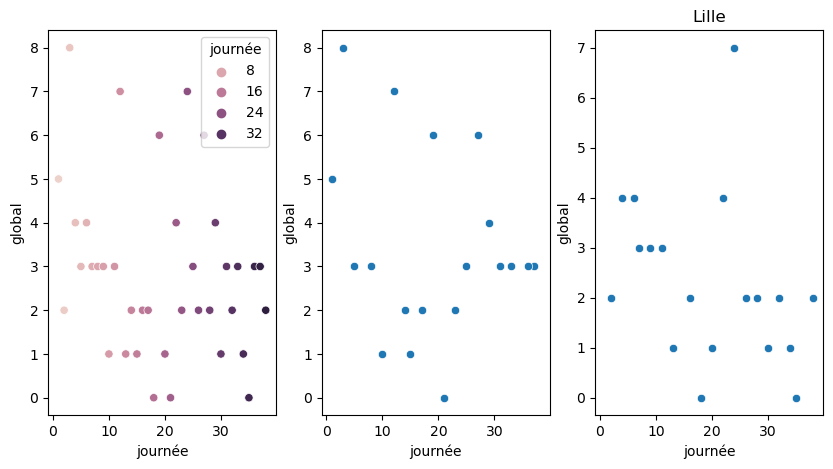

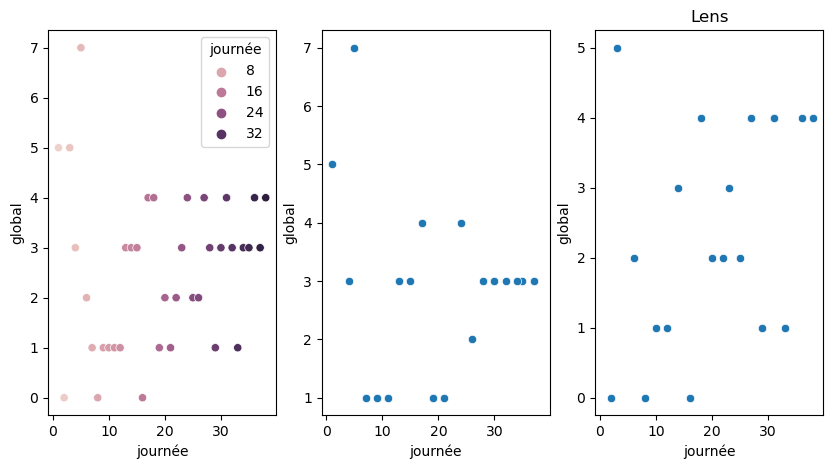

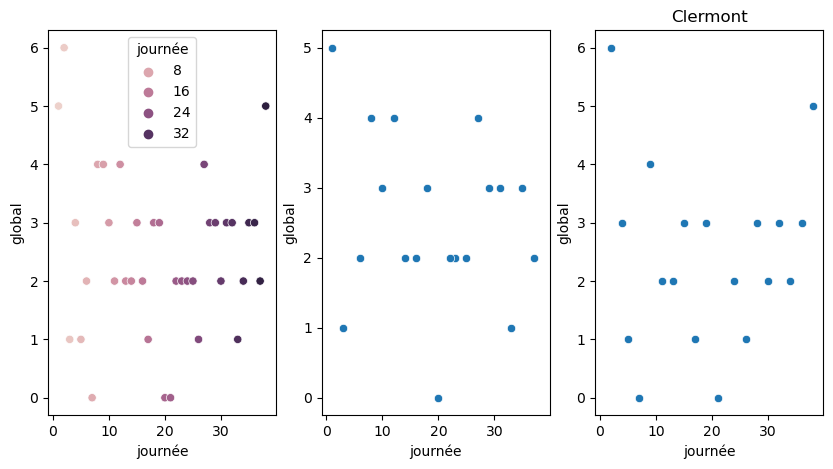

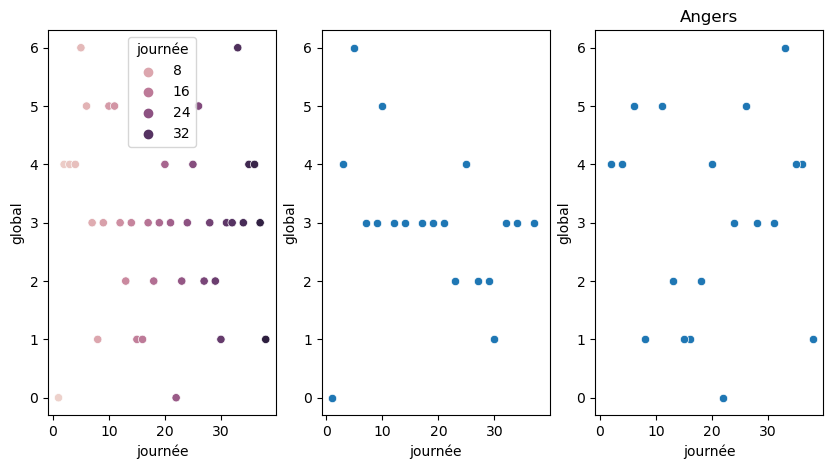

In [ ]:
for team in df['home_team'].unique():
    viz_scatter_features(team)

### Global (répresente la somme des buts des deux équipes)
    l'observation de la répartition des points nous permet d'identifier des patterns récurrents
    qui peuvent être différentes selon la localisation de l'équipes; par exemple:
    pour l'équipes d'Angers en L1, nous pouvons remarquer que les matchs ont plus de chance de terminer sur un total de Trois buts quand elle joue a domicile, mais a l'extérieur ce chiffre change.
* Nous allons observer les variables "total_home_team_goal" & "total_away_team_goal"  
***ICI nous pouvons observer nos variables aléatoire discrète suivent une distribution de poisson
et que la repartition des points de données n'est pas linéaire dans le temps.
Les variables ont l'air d'etre indépendante les une des autres

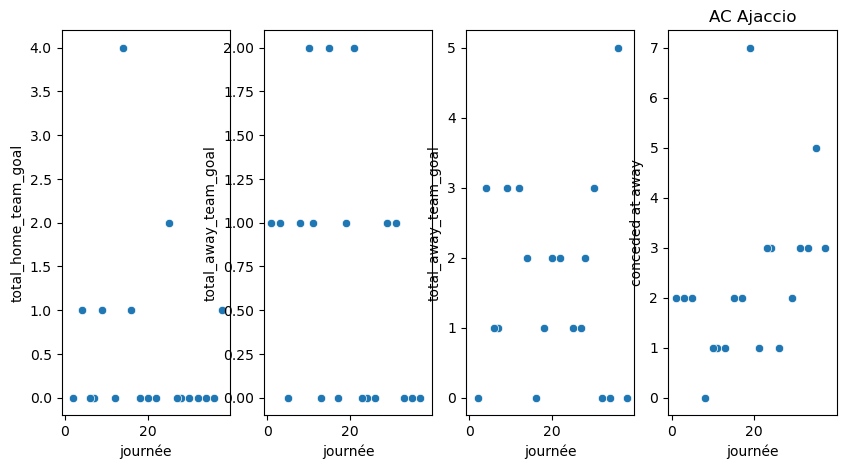

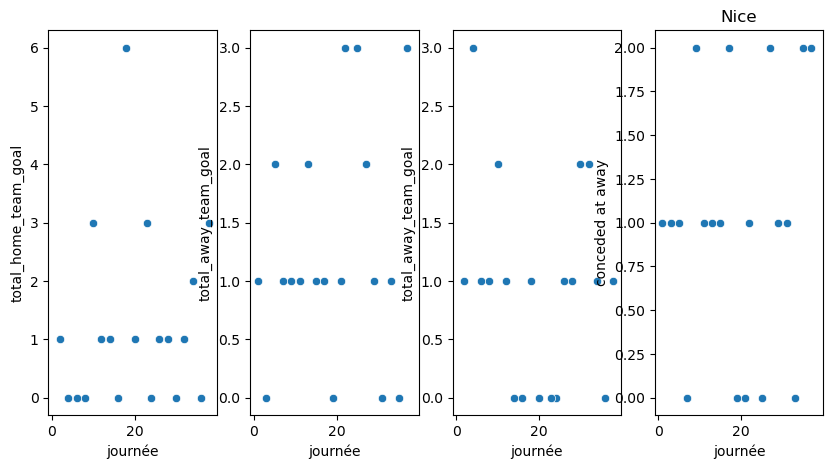

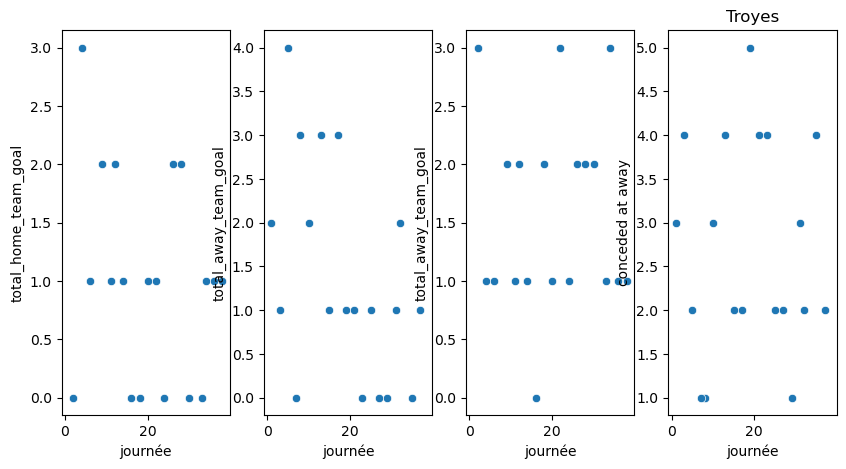

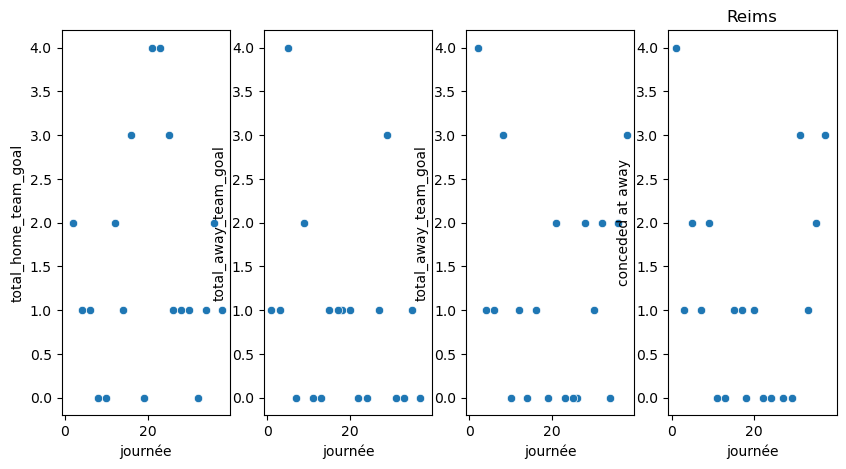

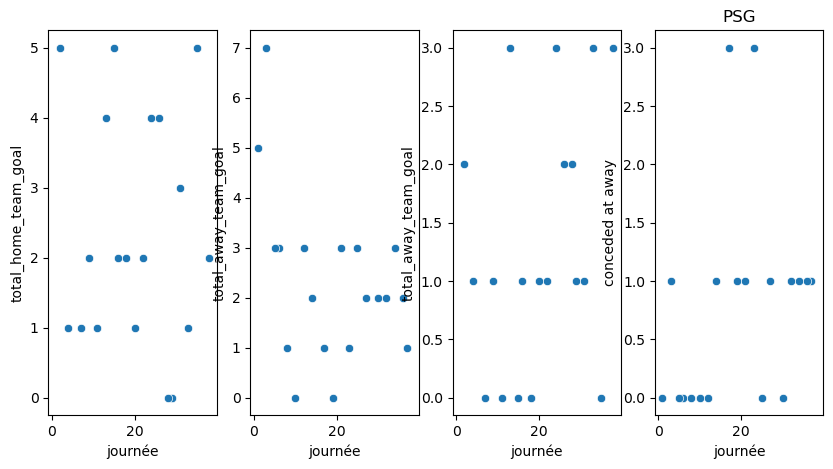

...

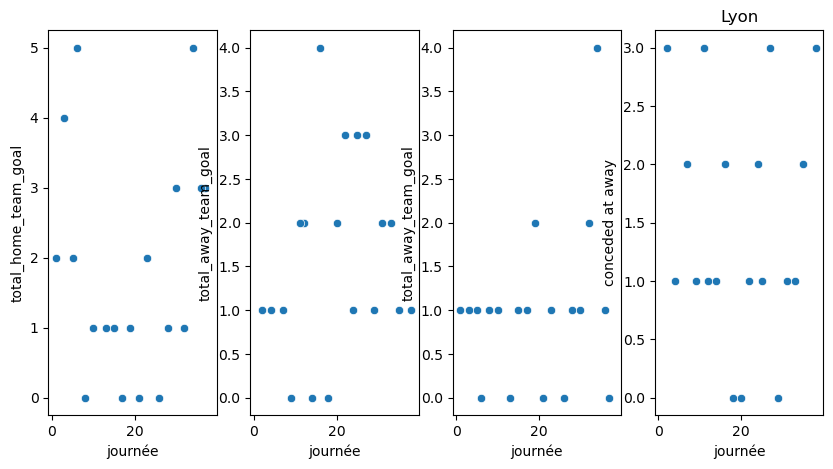

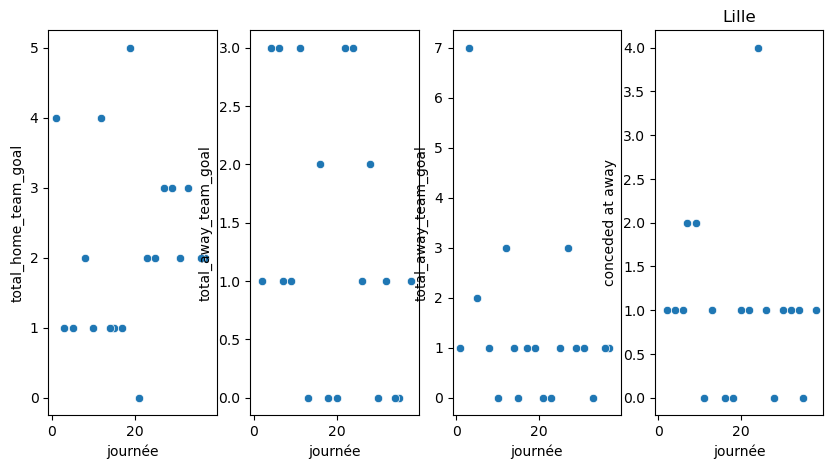

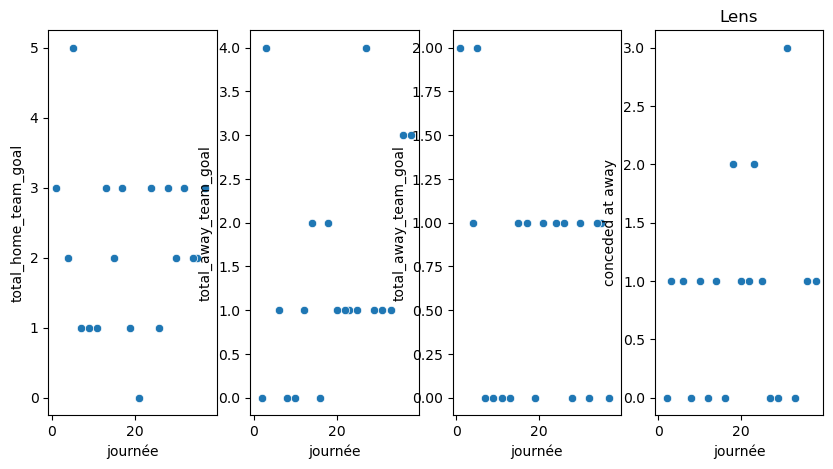

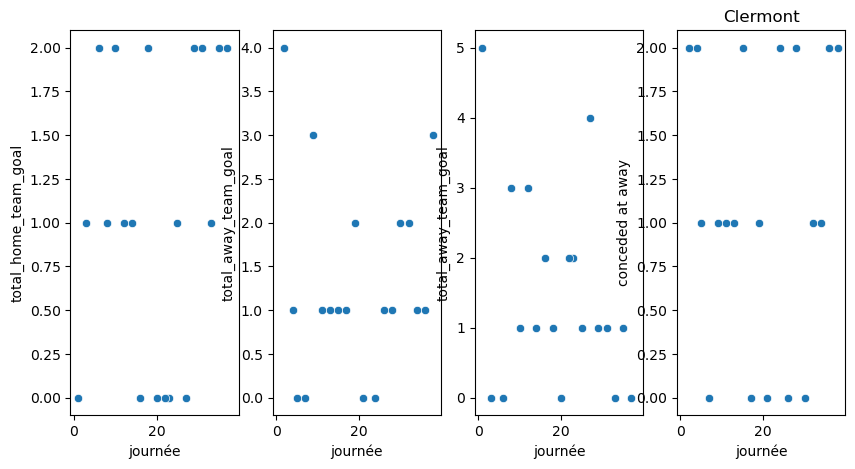

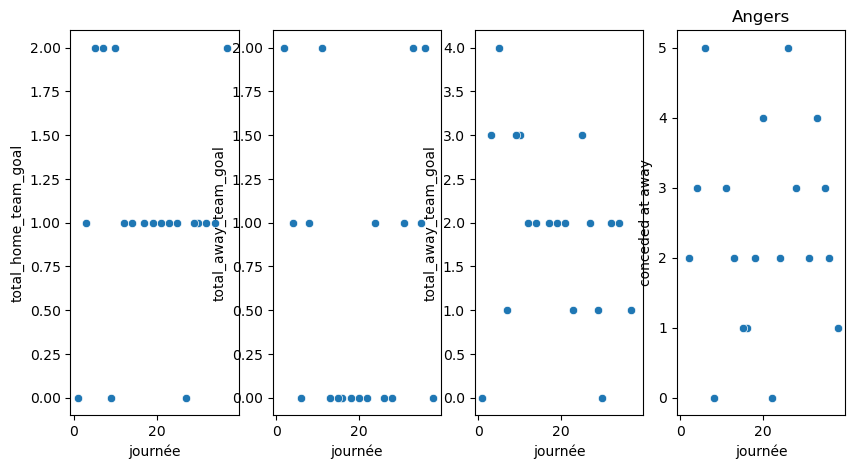

In [ ]:
def viz_scatter_total_team_goal (team):
    home = df[df['home_team']==team]
    away = df[df['away_team']==team]
    f, axes = plt.subplots(1, 4, sharex=True, figsize=(10, 5))
    # viz = sns.FacetGrid(home)
    # observer la répartion des buts scored quand team joue a domicile
    sns.scatterplot(data=home, y=home['total_home_team_goal'], x=home["journée"], ax=axes[0])
    plt.ylabel('scored at home')
    # observer la répartion des buts scored quand team joue a l'extérieur
    sns.scatterplot(data=away, y=away['total_away_team_goal'], x=away['journée'], ax=axes[1])
    plt.ylabel('scored at away')
    # observer la répartion des buts conceded quand team joue a domicile
    sns.scatterplot(data=home, y=home['total_away_team_goal'], x=home["journée"], ax=axes[2])
    plt.ylabel('conceded at home')
    # observer la répartion des buts conceded quand team joue a l'extérieur
    sns.scatterplot(data=away, y=away['total_home_team_goal'], x=away['journée'], ax=axes[3])
    plt.ylabel('conceded at away')
    plt.title(team)

for team in df['home_team'].unique():
    viz_scatter_total_team_goal(team)

## total_team_goal (répresente les buts marqué ou encaissé d'une équipe par rapport a sa localisation)
    l'observation est un peu similaire a ce que nous avons pu dire sur l'exploration de la variable "global".

### Feature Enginering
#### Création de nouvelles variables a partir de la variable cible

In [ ]:
import pymysql
import os

for i in dataset_at.columns:
    if i.endswith('ht'):
        dataset_at.drop(i, axis=1, inplace=True)
for i in dataset_ht.columns:
    if i.endswith('at'):
        dataset_ht.drop(i, axis=1, inplace=True)

## MODELING

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import f1_score, confusion_matrix, classification_report
from sklearn.model_selection import learning_curve
from sklearn.linear_model import SGDClassifier
from sklearn.feature_selection import VarianceThreshold, SelectKBest, SelectFromModel, chi2, f_classif
from sklearn.metrics import accuracy_score

In [ ]:
try:
    pwd = os.environ.get('DB_PWD')
    connection = pymysql.connect(
                 host='localhost',
                 user='hh',
                 passwd=pwd,
                 database='test')

    with connection.cursor() as cur:
        select_sql = "SELECT * FROM (`global_overall_ds`)"
        cur.execute(select_sql)
            # Fetch all the records
        columns = cur.description
        result = [{columns[index][0]: column for index, column in
                        enumerate(value)} for value in cur.fetchall()]
        dataset2 = pd.DataFrame(result)
        select_sql = "SELECT * FROM (`global_ds`)"
        cur.execute(select_sql)
            # Fetch all the records
        columns = cur.description
        result = [{columns[index][0]: column for index, column in
                        enumerate(value)} for value in cur.fetchall()]
        dataset3 = pd.DataFrame(result)
            #for i in result:
                #   print(i)
finally:
        connection.close()

NameError: name 'connection' is not defined

In [ ]:
dataset2.count()
dataset3.count()

journée         380
date_time       380
home_team       380
away_team       380
journée5_ht     360
journée4_ht     360
journée3_ht     360
journée2_ht     360
journée1_ht     360
journée5_at     360
journée4_at     360
journée3_at     360
journée2_at     360
journée1_at     360
over0_all_ht    360
over1_all_ht    360
over2_all_ht    360
over0_all_at    360
over1_all_at    360
over2_all_at    360
global          380
dtype: int64

In [ ]:
pd.set_option('display.max_row', 320)
#pd.options.display.max_rows = 135

In [ ]:
dataset3

,journée,date_time,home_team,away_team,journée5_ht,journée4_ht,journée3_ht,journée2_ht,journée1_ht,journée5_at,journée4_at,journée3_at,journée2_at,journée1_at,over0_all_ht,over1_all_ht,over2_all_ht,over0_all_at,over1_all_at,over2_all_at,global
0,1,2022-08-05 19:00:00,Lyon,AC Ajaccio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
1,1,2022-08-06 15:00:00,Strasbourg,Monaco,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
2,1,2022-08-06 19:00:00,Clermont,PSG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
3,1,2022-08-07 11:00:00,Toulouse,Nice,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
4,1,2022-08-07 13:00:00,Montpellier,Troyes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375,38,2023-06-03 19:00:00,PSG,Clermont,4.0,3.0,4.0,3.0,5.0,3.0,3.0,2.0,3.0,3.0,100.0,80.0,60.0,100.0,100.0,60.0,5
376,38,2023-06-03 19:00:00,Reims,Montpellier,2.0,2.0,1.0,2.0,4.0,4.0,4.0,9.0,4.0,3.0,100.0,80.0,40.0,100.0,100.0,80.0,4
377,38,2023-06-03 19:00:00,Troyes,Lille,3.0,1.0,4.0,3.0,2.0,1.0,2.0,1.0,1.0,0.0,100.0,80.0,40.0,80.0,40.0,0.0,2
378,38,2023-06-03 19:00:00,Nice,Lyon,3.0,2.0,3.0,2.0,0.0,3.0,3.0,3.0,3.0,3.0,80.0,80.0,40.0,100.0,80.0,80.0,4


##### les données contiennent énormement de valeurs null avant la 6e journée. Je pourrais scinder mon jeu de données a partie de la et utiliser un simple imputer dans mon pipeline pour remplacer les valeurs null restante avec une strategy "mean"

In [ ]:
short_dataset2 = dataset2[dataset2['journée']>5]
short_dataset2 = dataset2[dataset2['journée']<11]
short_dataset3 = dataset3[dataset3['journée']>10]
concat_dataset = pd.concat([short_dataset2, short_dataset3], axis=0)

In [ ]:
short_df = df[['journée', 'date_time', 'home_team', 'away_team', 'target']]
concat_dataset = pd.merge(concat_dataset, short_df, on=['journée', 'date_time', 'home_team', 'away_team'])
concat_dataset.drop_duplicates(subset=["date_time", "home_team", "away_team"],
                        keep="last", inplace=True)

In [ ]:
concat_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 380 entries, 0 to 379
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   journée       380 non-null    int64         
 1   date_time     380 non-null    datetime64[ns]
 2   home_team     380 non-null    object        
 3   away_team     380 non-null    object        
 4   journée5_ht   370 non-null    float64       
 5   journée4_ht   370 non-null    float64       
 6   journée3_ht   370 non-null    float64       
 7   journée2_ht   370 non-null    float64       
 8   journée1_ht   370 non-null    float64       
 9   journée5_at   370 non-null    float64       
 10  journée4_at   370 non-null    float64       
 11  journée3_at   370 non-null    float64       
 12  journée2_at   370 non-null    float64       
 13  journée1_at   370 non-null    float64       
 14  over0_all_ht  370 non-null    float64       
 15  over1_all_ht  370 non-null    float64   

In [ ]:
pd.set_option('display.max_row', 380)
concat_dataset

,journée,date_time,home_team,away_team,journée5_ht,journée4_ht,journée3_ht,journée2_ht,journée1_ht,journée5_at,journée4_at,journée3_at,journée2_at,journée1_at,over0_all_ht,over1_all_ht,over2_all_ht,over0_all_at,over1_all_at,over2_all_at,global,target
0,1,2022-08-05 19:00:00,Lyon,AC Ajaccio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,1
1,1,2022-08-06 15:00:00,Strasbourg,Monaco,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,1
2,1,2022-08-06 19:00:00,Clermont,PSG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,1
3,1,2022-08-07 11:00:00,Toulouse,Nice,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,0
4,1,2022-08-07 13:00:00,Montpellier,Troyes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,1
5,1,2022-08-07 13:00:00,Lille,Auxerre,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,1
6,1,2022-08-07 13:00:00,Lens,Brest,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,1
7,1,2022-08-07 13:00:00,Angers,Nantes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
8,1,2022-08-07 15:05:00,Rennes,Lorient,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0
9,1,2022-08-07 18:45:00,Marseille,Reims,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,1


In [ ]:
concat_dataset = concat_dataset[concat_dataset['journée']>5]
x = concat_dataset.drop(['date_time', 'journée', 'home_team', 'away_team', 'target', 'global', 'over0_all_ht',
'over0_all_at', 'over1_all_ht', 'over1_all_at'], axis=1)
y = concat_dataset['target']

In [ ]:
def model_training (x=x, y=y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)
    feature_columns = x.columns.to_list()
    # NaN = ['mp5_ht', 'mp4_ht']
    # target_pipeline = make_pipeline(LabelEncoder())
    # NaN_pipeline = make_pipeline(SimpleImputer(strategy = 'constant'))
    feature_pipeline = make_pipeline(MinMaxScaler())

    preprocessor = make_column_transformer((feature_pipeline, feature_columns))
    estimateurs = [DecisionTreeClassifier(random_state=1), RandomForestClassifier(random_state=1),
                  KNeighborsClassifier(n_neighbors=4), SGDClassifier(random_state=1)]
    for estimateur in estimateurs:
        model = make_pipeline(preprocessor, estimateur)
        model.fit(x_train, y_train)
        print(f"score {estimateur.__class__.__name__}: {model.score(x_test, y_test)}")
        
        y_pred = model.predict(x_test)
        # print(accuracy_score(y_test, y_pred))
    
        # print(confusion_matrix(y_test, y_pred))
        # print(classification_report(y_test, y_pred))

In [ ]:
model_training()

score DecisionTreeClassifier: 0.5151515151515151
score RandomForestClassifier: 0.5151515151515151
score KNeighborsClassifier: 0.5606060606060606
score SGDClassifier: 0.4696969696969697


/home/hhanstein/miniconda3/envs/datascience/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/home/hhanstein/miniconda3/envs/datascience/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, a

#### Entrainer les données sur les valeurs précedantes donne un assez bon résultat avec l'algorithme des KNN, a notez que mon dataset contient quelques valeurs null qu'il a fallu gerer avec un simpleImputer. Le truc est de savoir si on altère pas un peu nos données en utilisant cette stratégie.

/tmp/ipykernel_9800/532833114.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  coor = home[home.columns[1:]].corr()


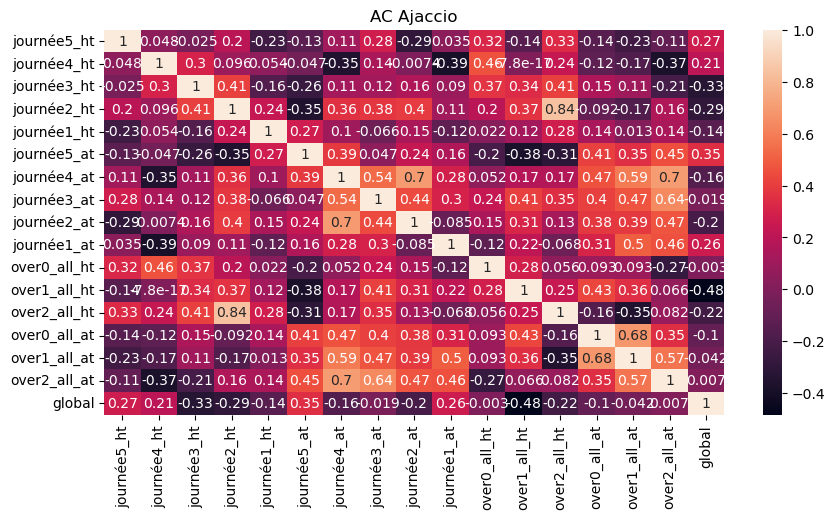

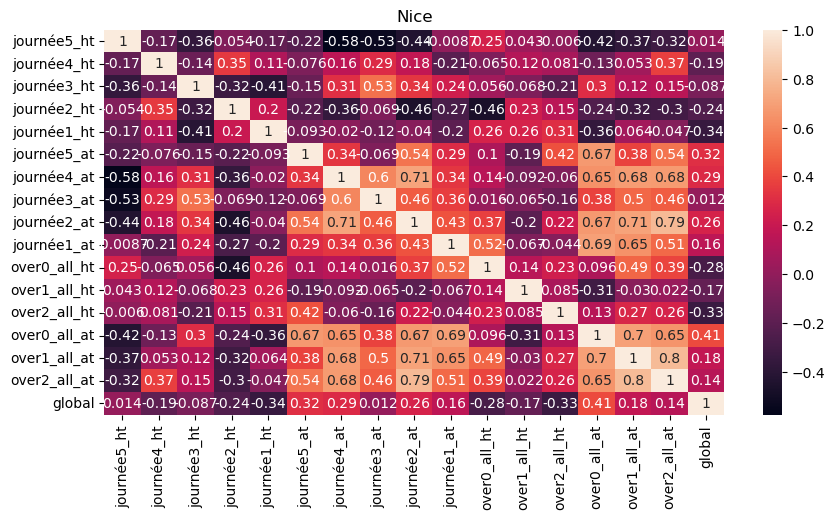

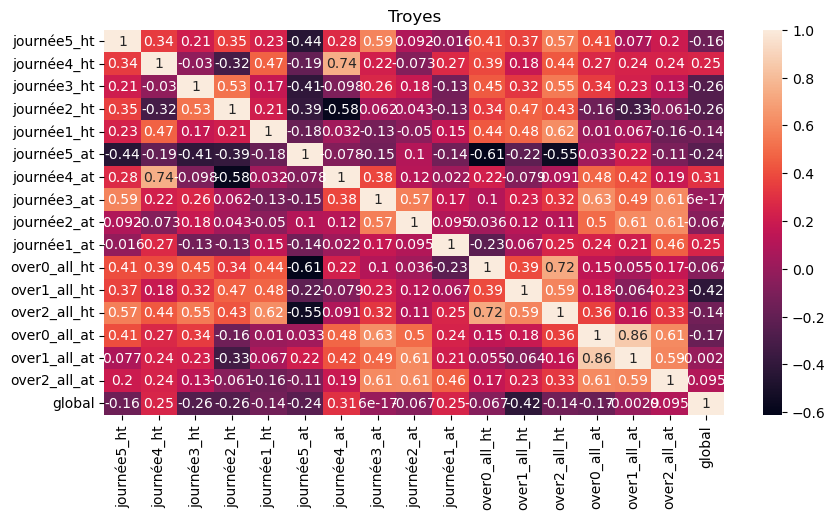

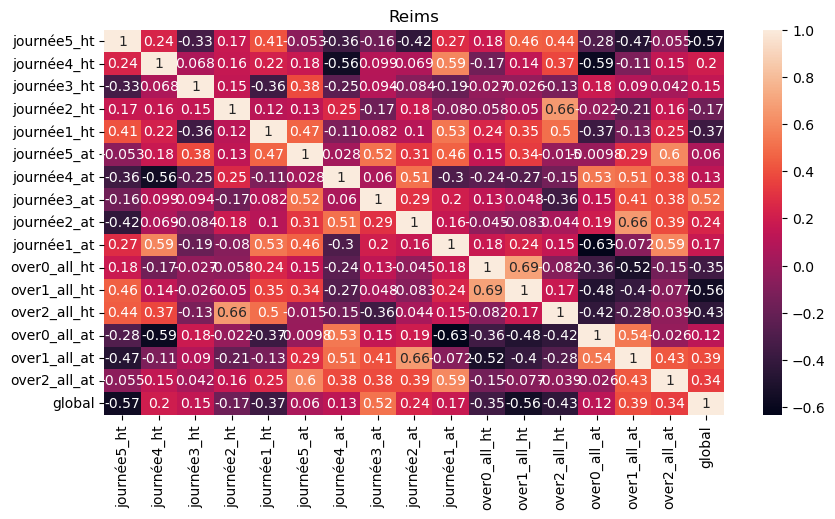

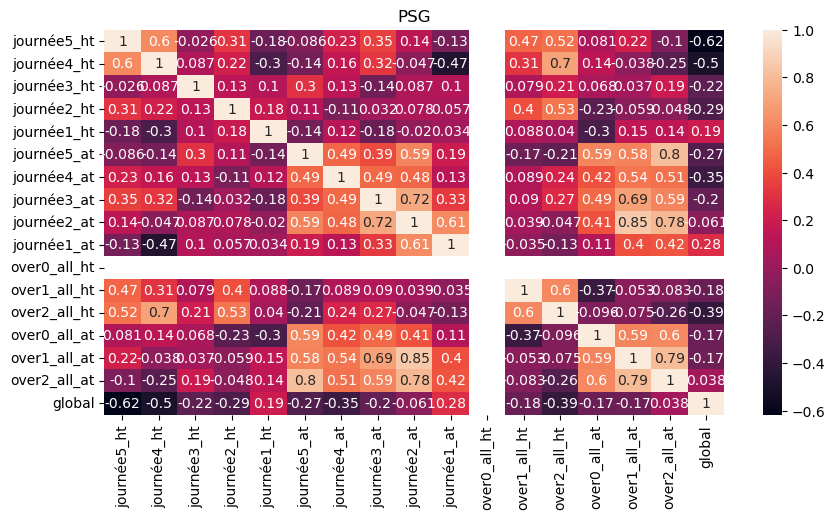

...

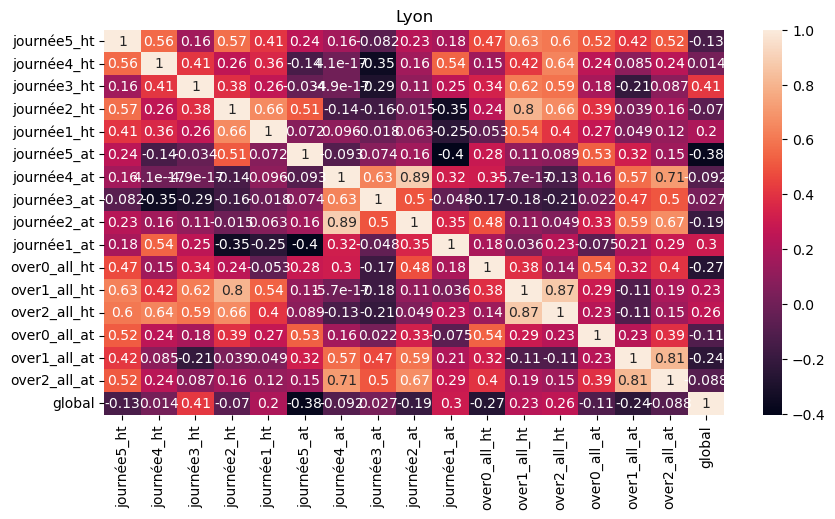

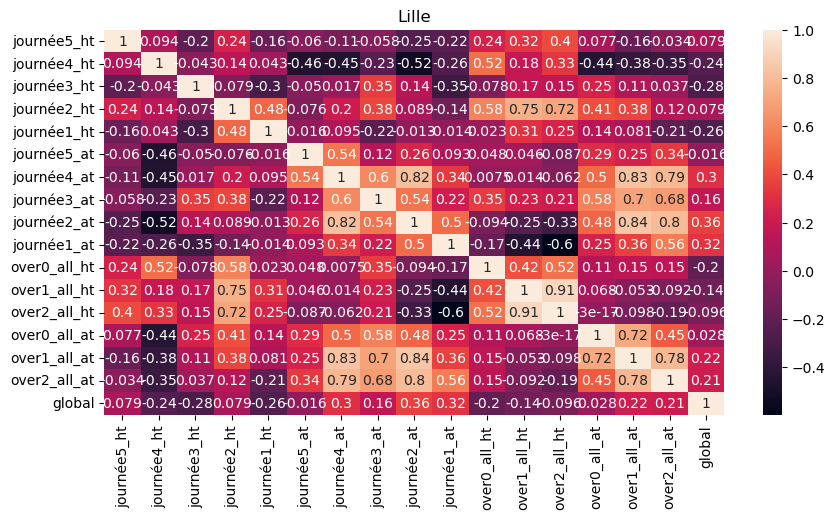

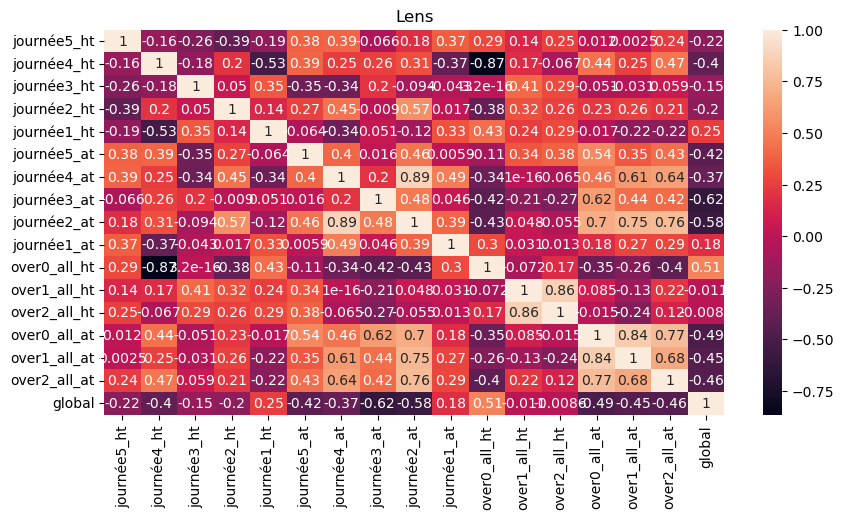

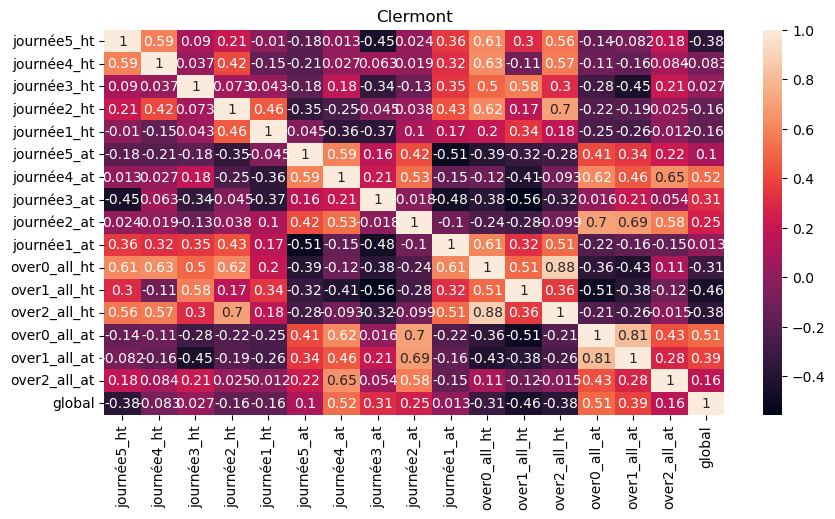

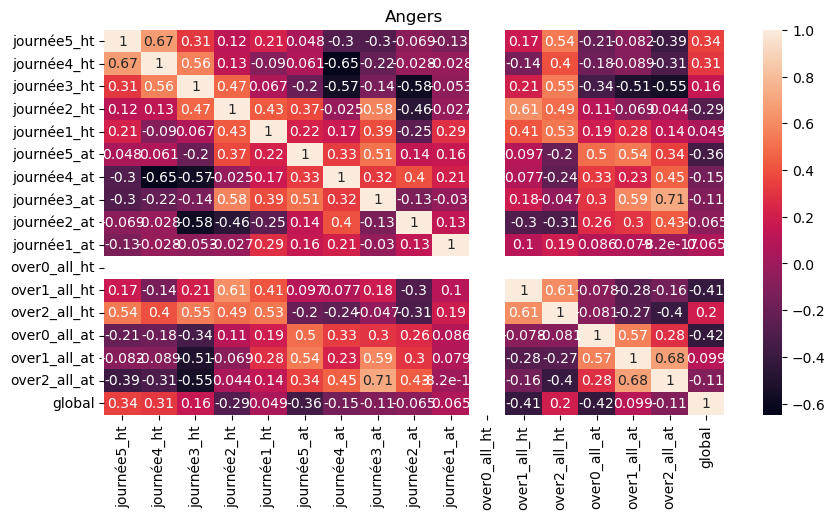

In [ ]:
def coor_ht(team):
    home = concat_dataset[concat_dataset['home_team']==team]
    coor = home[home.columns[1:]].corr()
    plt.figure(figsize=(10,5))
    sns.heatmap(coor, annot=True)
    plt.title(team)
    
for team in df['home_team'].unique():
    coor_ht(team)